
# Train YOLOv12 Object detect behavior

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

- Latancy là thời gian chễ. Nếu càng thấp thì model tốt
- FLOPs là số lượng ghép dấu chấm động mà mô hình thực hiện để
xử lý ảnh. Chỉ số này thể hiện mức độ phức tạp của mô hình
- Ms COCO mAP độ chính xác trung bình ngưỡng

## 1. Introduction and Environment setup

### 1.1 Kiến trúc YOLOv12

* Tham chieu:

### 1.2 Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Tue Mar 11 23:02:24 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.216.01             Driver Version: 535.216.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A30                     Off | 00000000:D8:00.0 Off |                    0 |
| N/A   43C    P0              35W / 165W |  22545MiB / 24576MiB |     17%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Torch Version:", torch.__version__)
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


CUDA Available: True
Torch Version: 2.6.0+cu118
GPU Name: NVIDIA A30


### 1.3 Kết nối tới google drive tải flash-attn

In [5]:
# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Di chuyển đến thư mục bạn muốn lưu trong Drive
%cd /content/drive/MyDrive

ModuleNotFoundError: No module named 'google.colab'

In [5]:
!pip install flash-attn --only-binary :all:

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement flash-attn (from versions: none)
ERROR: No matching distribution found for flash-attn


### 1.4 Clone ngay tại thư mục đang làm việc ( Git, flash-attn roboflow)

In [9]:
!git clone https://github.com/sunsmarterjie/yolov12.git

Cloning into 'yolov12'...
remote: Enumerating objects: 956, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 956 (delta 213), reused 181 (delta 180), pack-reused 722 (from 1)
Receiving objects: 100% (956/956), 1.59 MiB | 1.36 MiB/s, done.
Resolving deltas: 100% (455/455), done.


In [22]:
!pip install git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/sunsmarterjie/yolov12.git to /tmp/pip-req-build-cnr8td6d
  Running command git clone --filter=blob:none --quiet https://github.com/sunsmarterjie/yolov12.git /tmp/pip-req-build-cnr8td6d
  Resolved https://github.com/sunsmarterjie/yolov12.git to commit e011b1012ccbd6f208afe29dc21e251920c76784
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached flash_attn-2.7.4.post1.tar.gz (6.0 MB)
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [11 lines of output]
      
      
      torch.__version__  = 2.6.0+cu118
      
      
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/t

#### 1.4.1  Download dataset from Roboflow Universe

In [16]:
!pip install roboflow supervision flash-attn==2.0.2

Defaulting to user installation because normal site-packages is not writeable
  Using cached supervision-0.25.1-py3-none-any.whl.metadata (14 kB)


In [23]:
pip install flash-attn==2.0.2


Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 9.0 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [4684 lines of output]
      
      
      torch.__version__  = 2.6.0+cu118
      
      
      fatal: not a git repository (or any of the parent directories): .git
      running bdist_wheel
      running build
      running build_py
      creating build/lib.linux-x86_64-cpython-312/flash_attn
      copying flash_attn/flash_attn_interface.py -> build/lib.linux-x86_64-cpython-312/flash_attn
      copying flash_attn/flash_attn_triton.py -> build/lib.linux-x86_64-cpython-312/flash_attn
      copying flash_attn/flash_attn_triton_og.py -> build/lib.linux-x86_64-cpython-312/flash_attn
      copying flash_attn/flash_attn_triton_tmp.py -> build/lib.linux-x86_64-cpython-31

In [25]:
import os
print(os.getcwd())

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12


In [13]:
from roboflow import Roboflow
import os
import shutil

%cd "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/"


rf = Roboflow(api_key="JutTY4tTGxWHjEqJiZNb")
project = rf.workspace("nhan-dien-hanh-vi-trong-lop-hoc").project("student-behavior-recognition")
## Chọn version
version = project.version(5)
dataset = version.download("yolov12")

# # Tải version 3 của dataset với format YOLOv5
print(f"Dữ liệu đã tải về: {dataset.location}")

# Đường dẫn lưu trữ trong Google Drive
# drive_dataset_path = '/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/'

# # Tạo thư mục nếu chưa tồn tại
# os.makedirs(drive_dataset_path, exist_ok=True)

# # Sao chép toàn bộ thư mục dataset sang Google Drive
# shutil.copytree(dataset.location, drive_dataset_path, dirs_exist_ok=True)

# print(f"Đã sao chép dataset đến: {drive_dataset_path}")

# # In ra cấu trúc thư mục để kiểm tra
# import subprocess
# print("\nCấu trúc thư mục:")
# subprocess.run(f"tree {drive_dataset_path}", shell=True)

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Student-Behavior-Recognition-5 in yolov12:: 100%|██████████| 5022/5022 [00:01<00:00, 4108.08it/s]


Dữ liệu đã tải về: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5


In [14]:
# In ra cấu trúc thư mục để kiểm tra
import subprocess
print("\nCấu trúc thư mục:")
subprocess.run(f"tree {drive_dataset_path}", shell=True)


Cấu trúc thư mục:


NameError: name 'drive_dataset_path' is not defined

In [171]:
!ls {drive_dataset_path}

13800.70s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
Student-Behavior-Recognition-1	Student-Behavior-Recognition-2


**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [29]:
!sed -i '$d' {drive_dataset_path}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {drive_dataset_path}/data.yaml

In [30]:
!cat {drive_dataset_path}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4
names: ['drinking', 'sleeping', 'using_computer', 'using_phone']

roboflow:
  workspace: nhan-dien-hanh-vi-trong-lop-hoc
  project: student-behavior-recognition
  version: 1
  license: CC BY 4.0
test: ../test/images
train: ../train/images
val: ../valid/images


### 2.1 Data yaml path

- Student-Behavior-Recognition-2 : Version ngày 11-03-2025 có những bức ảnh using computer chỉ gán mỗi tay không gán cả người

In [5]:
data_yaml_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml"

#### 2.1.1 Hàm lấy đường dẫn duy nhất ( Quy tắc đường dẫn )

In [6]:
from datetime import datetime
import os
def get_unique_path(base_path):
    """
    Tạo đường dẫn duy nhất bằng cách thêm phiên bản nếu thư mục đã tồn tại

    Args:
        base_path (str): Đường dẫn gốc muốn tạo

    Returns:
        str: Đường dẫn duy nhất
    """
    # Nếu thư mục chưa tồn tại, trả về ngay
    if not os.path.exists(base_path):
        return f"{base_path}_ver{1}"

    # Nếu đã tồn tại, tìm phiên bản tiếp theo
    version = 2
    while True:
        versioned_path = f"{base_path}_ver{version}"
        if not os.path.exists(versioned_path):
            return versioned_path
        version += 1
        
# Tạo đường dẫn lưu trữ với thư mục theo ngày
current_date = datetime.now().strftime("%d%m%Y_%H%M%S")
nameYoloFamily = 'yolov12s'
### base
ver_dataset = 5
base_save_path = f'/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/{nameYoloFamily}{current_date}_ver-dataset{ver_dataset}/'

# Lấy đường dẫn duy nhất ----------------------------------Đường dẫn này cũng là quan trọng. Vì các báo cáo dưới đều càn đến
unique_save_path = get_unique_path(base_save_path)
# Tạo thư mục
os.makedirs(unique_save_path, exist_ok=True)

## 3. Fine-tune YOLOv12 model

We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12s.yaml`, but you can replace it with any other model (e.g., 
- `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) 

based on your preference. We set the training to run for 100 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

### 3.1 Import YOLO, Datetime

In [10]:
import os
import shutil
from datetime import datetime
from ultralytics import YOLO
import torch
print(torch.__version__)  # Check PyTorch version
print(torch.cuda.get_device_name(0))  # Check GPU model
print(torch.backends.cuda.flash_sdp_enabled())  # Check if FlashAttention is available


FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
2.6.0+cu118
NVIDIA A30
True


### 3.3 Phiên bản YOLOv12:
YOLOv12n: Phiên bản nhỏ nhất, thường được sử dụng trong các ứng dụng yêu cầu tốc độ cao và tài nguyên thấp.

YOLOv12s: Phiên bản nhỏ, cung cấp sự cân bằng giữa tốc độ và độ chính xác.

YOLOv12m: Phiên bản trung bình, tăng cường độ chính xác so với phiên bản nhỏ.

YOLOv12l: Phiên bản lớn, cung cấp độ chính xác cao hơn nữa nhưng yêu cầu nhiều tài nguyên hơn.

YOLOv12x: Phiên bản lớn nhất, đạt được độ chính xác cao nhất nhưng cũng đòi hỏi nhiều tài nguyên nhất.

#### 3.3.1 Check version CUDA

In [11]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("CUDA Version:", torch.version.cuda)
print("Torch Version:", torch.__version__)
print("GPU Count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))


CUDA Available: True
CUDA Version: 11.8
Torch Version: 2.6.0+cu118
GPU Count: 1
GPU Name: NVIDIA A30


### 3.4 Traning model

In [ ]:
import pandas as pd
# Tạo đường dẫn lưu trữ với thư mục theo ngày
current_date = datetime.now().strftime("%d%m%Y")
nameYoloFamily = 'yolov12m'

# Lấy đường dẫn duy nhất ----------------------------------Đường dẫn này cũng là quan trọng. Vì các báo cáo dưới đều càn đến
unique_save_path = get_unique_path(base_save_path)
# Tạo thư mục
os.makedirs(unique_save_path, exist_ok=True)

# Tạo mô hình và huấn luyện
model_filename = f'{nameYoloFamily}{current_date}.pt'
full_model_path = os.path.join(unique_save_path, model_filename)
# Tạo mô hình YOLO và cấu hình
model = YOLO(f'{nameYoloFamily}.yaml')

# Thay đổi thư mục làm việc
%cd "{unique_save_path}"

# Dữ liệu
path_data_yaml = '/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml'


#------------------ Traning model
'''
Giả sử bạn bắt đầu với batch size = 32 và learning rate = 0.001.

Nếu bạn tăng batch size lên 64, bạn có thể tăng learning rate lên 0.001 * (64/32) = 0.002.

Nếu bạn giảm batch size xuống 16, bạn có thể giảm learning rate xuống 0.001 * (16/32) = 0.0005.
'''
batch_size = 32
num_epochs = 500
# Khởi tạo log
log_data = []

results = model.train(
    data = path_data_yaml,
    epochs= num_epochs,
    patience= 50,  # Số epoch đợi để dừng nếu không cải thiện
    save_period=-1,  # Lưu checkpoint sau mỗi epoch
    save=True,
    optimizer='Adam',  # Lựa chọn optimizer
    lrf=0.001*(batch_size/32),
    batch=batch_size
)

# Lưu mô hình cuối cùng
if not os.path.exists(full_model_path):
    model.save(full_model_path)
else:
  print(f"Mô hình đã tồn tại tại: {full_model_path}")

# In thông tin về mô hình đã lưu
print(f"Mô hình đã được lưu tại: {full_model_path}")

# Kiểm tra và in kích thước file
model_size = os.path.getsize(full_model_path) / (1024 * 1024)  # Chuyển sang MB
print(f"Kích thước mô hình: {model_size:.2f} MB")

# Đảm bảo sử dụng UTF-8 encoding
log_path = os.path.join(unique_save_path, 'training_log_2.txt')
with open(log_path, 'w', encoding='utf-8') as log_file:
    log_file.write(f"Mô hình: {nameYoloFamily}\n")
    log_file.write(f"Ngày huấn luyện: {current_date}\n")
    log_file.write(f"Số epochs: {num_epochs} \n")
    log_file.write(f"Kích thước mô hình: {model_size:.2f} MB\n")
    # log_file.write(f"Đường dẫn thư mục runs: {runs_destination_path}\n")

print(f"Đã ghi log tại: {log_path}")

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s11032025_230655_ver-dataset5/_ver2
New https://pypi.org/project/ultralytics/8.3.87 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.12.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA A30, 24062MiB)
engine/trainer: task=detect, mode=train, model=yolov12m.yaml, data=/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml, epochs=500, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, hal

100%|██████████| 5.26M/5.26M [00:00<00:00, 13.7MB/s]


AMP: checks passed ✅


train: Scanning /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/labels... 521 images, 0 backgrounds, 0 corrupt:  27%|██▋       | 521/1905 [00:00<00:01, 842.95it/s]

train: Scanning /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/labels... 1905 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1905/1905 [00:02<00:00, 840.69it/s]

train: New cache created: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/labels.cache



val: Scanning /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/valid/labels... 179 images, 0 backgrounds, 0 corrupt: 100%|██████████| 179/179 [00:00<00:00, 803.23it/s]

val: New cache created: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 131 weight(decay=0.0), 138 weight(decay=0.0005), 137 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      21.9G      3.662      3.694      3.282        177        640: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        179       1229          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      21.8G      2.855      2.846      2.315        250        640: 100%|██████████| 60/60 [00:42<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229      0.104     0.0969     0.0427     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      21.9G      2.662      2.665      2.165        213        640: 100%|██████████| 60/60 [00:42<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all        179       1229      0.119      0.184      0.091     0.0352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500      21.8G      2.454      2.426      2.048        206        640: 100%|██████████| 60/60 [00:42<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all        179       1229      0.338    0.00925     0.0016   0.000558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      21.7G      2.367      2.323      2.004        242        640: 100%|██████████| 60/60 [00:43<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all        179       1229      0.349      0.199      0.185     0.0757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500      21.7G       2.27      2.166      1.938        219        640: 100%|██████████| 60/60 [00:44<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all        179       1229      0.164      0.182       0.15     0.0617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      21.7G      2.223      2.102      1.902        217        640: 100%|██████████| 60/60 [00:48<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        179       1229      0.335      0.323      0.207      0.095



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      21.8G      2.181      2.045      1.865        174        640: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        179       1229      0.408      0.268      0.229      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      21.7G       2.14      2.021      1.846        190        640: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]

                   all        179       1229     0.0111      0.419    0.00925    0.00426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      21.8G      2.121      1.959       1.83        213        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all        179       1229      0.275      0.228       0.21     0.0878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      21.9G      2.068      1.905      1.792        251        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        179       1229      0.594      0.302      0.239      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      21.7G      2.055      1.861      1.782        222        640: 100%|██████████| 60/60 [00:53<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229       0.37      0.314      0.219     0.0972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      21.8G      2.029      1.834      1.781        180        640: 100%|██████████| 60/60 [00:52<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229      0.635      0.311       0.26      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      21.7G      2.021      1.828       1.75        213        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        179       1229      0.589      0.358      0.275      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      21.9G      1.984      1.793      1.746        269        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        179       1229      0.452      0.327      0.273      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      21.8G      1.984      1.791      1.736        210        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.534      0.406      0.322      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      21.7G      1.958       1.75       1.71        141        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        179       1229      0.424      0.451      0.349      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/500      21.7G      1.978      1.753      1.719        172        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        179       1229      0.525      0.455      0.332      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      21.9G      1.948      1.721      1.704        180        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229      0.558      0.389      0.273      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      21.7G      1.928      1.719      1.694        220        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.01it/s]

                   all        179       1229      0.422      0.411      0.292      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      21.9G      1.939      1.723      1.704        189        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        179       1229      0.578      0.407      0.342      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      21.7G      1.912      1.686      1.698        211        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all        179       1229      0.572       0.36      0.315      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      21.8G      1.909      1.678      1.669        233        640: 100%|██████████| 60/60 [00:51<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all        179       1229      0.511      0.437       0.36      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      21.9G      1.916      1.676      1.678        231        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.573      0.429      0.333      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      21.8G      1.898       1.69      1.658        167        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.468      0.451      0.338       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      21.9G      1.879      1.657      1.653        230        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        179       1229       0.52      0.408      0.348      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      21.8G      1.875      1.642      1.658        248        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all        179       1229      0.591      0.389       0.29       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      21.8G      1.861      1.635      1.631        181        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all        179       1229      0.399      0.453      0.372      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      21.7G      1.858      1.639      1.639        280        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        179       1229      0.474      0.427      0.359      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      21.9G      1.859      1.628      1.641        213        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        179       1229      0.601      0.328      0.293      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      21.9G      1.853      1.626      1.631        200        640: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        179       1229      0.529      0.512      0.346      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      21.9G       1.83      1.593      1.614        220        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all        179       1229      0.452      0.398      0.331      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      21.7G      1.832      1.596      1.622        249        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        179       1229      0.593      0.394      0.367      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      21.8G      1.834      1.604      1.616        215        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all        179       1229      0.469       0.35      0.307      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      21.8G      1.833      1.589      1.632        218        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229       0.59      0.417       0.37      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      21.9G      1.822      1.576      1.606        218        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        179       1229      0.293      0.467      0.304      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      21.8G      1.828      1.579      1.614        231        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.421       0.45      0.375      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      21.8G      1.838      1.597      1.601        189        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.477      0.436      0.369      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      21.9G      1.847       1.59      1.614        223        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.645      0.375      0.365      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      21.8G      1.811      1.566      1.601        176        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229      0.472      0.359      0.317      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      21.9G      1.816      1.562      1.602        210        640: 100%|██████████| 60/60 [00:51<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        179       1229      0.623      0.385      0.371      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      21.8G      1.809       1.56      1.604        161        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        179       1229      0.293      0.396      0.338      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      21.9G      1.796      1.551      1.584        227        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all        179       1229      0.335      0.532      0.366      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500      21.7G      1.786      1.539      1.601        199        640: 100%|██████████| 60/60 [00:51<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        179       1229      0.273      0.399      0.325      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500      21.7G      1.798       1.53      1.598        175        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        179       1229      0.582      0.464      0.391      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      21.8G      1.801      1.531        1.6        191        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        179       1229      0.458      0.385      0.319      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      21.9G      1.789      1.514      1.588        209        640: 100%|██████████| 60/60 [00:51<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.447      0.477      0.358      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      21.7G      1.786      1.522      1.595        256        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all        179       1229      0.469      0.372      0.324      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500      21.7G      1.782      1.532      1.588        254        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.628      0.393      0.323      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      21.7G      1.786      1.531      1.582        226        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        179       1229      0.482      0.429      0.387      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500      21.8G      1.784      1.522      1.581        192        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all        179       1229      0.318      0.399      0.329      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      21.7G      1.775      1.504      1.575        280        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.647      0.352      0.326      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      21.7G      1.773      1.515      1.589        188        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        179       1229      0.417      0.445      0.364      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      21.7G      1.763      1.501      1.579        144        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all        179       1229      0.628      0.411       0.32      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500      21.8G      1.761      1.506      1.569        273        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all        179       1229       0.54      0.425      0.383      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      21.7G      1.757      1.487      1.582        177        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        179       1229      0.338      0.431      0.392      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500      21.9G      1.761      1.504      1.562        191        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all        179       1229      0.486      0.346      0.361      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      21.8G      1.775      1.486      1.567        252        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all        179       1229      0.578      0.479      0.377      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      21.8G       1.76      1.498      1.556        258        640: 100%|██████████| 60/60 [00:49<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229       0.55      0.448      0.375      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      21.9G      1.753      1.483      1.562        207        640: 100%|██████████| 60/60 [00:49<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        179       1229      0.476      0.385      0.336      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      21.7G      1.753      1.485      1.559        219        640: 100%|██████████| 60/60 [00:49<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        179       1229      0.628      0.472      0.412      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      21.7G      1.743      1.475      1.564        232        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.644        0.4      0.359      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      21.8G       1.73      1.466       1.55        208        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.491      0.386      0.336      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      21.9G      1.733      1.461      1.543        206        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

                   all        179       1229      0.651      0.396      0.373      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500      21.9G      1.742      1.474      1.554        205        640: 100%|██████████| 60/60 [00:51<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.372      0.472      0.382      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      21.7G      1.726      1.443      1.547        269        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.661      0.416      0.345      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      21.7G      1.724      1.452      1.556        155        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.606      0.454      0.409      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500      21.7G      1.728      1.458      1.556        228        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all        179       1229      0.566      0.428      0.374      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      21.7G      1.717      1.434      1.546        170        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        179       1229      0.567      0.417      0.378      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      21.9G      1.708      1.442      1.533        213        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.674      0.427       0.37      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      21.7G      1.721      1.436      1.544        181        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all        179       1229      0.604      0.447      0.384      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      21.8G      1.732      1.444      1.541        240        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        179       1229      0.607      0.496      0.418       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      21.9G      1.714      1.439      1.544        250        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all        179       1229      0.615      0.492      0.416      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      21.9G      1.702      1.435      1.551        240        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        179       1229      0.598       0.56      0.416      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      21.7G      1.715      1.443      1.548        228        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all        179       1229      0.607      0.488       0.42      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      21.9G      1.702      1.423      1.542        242        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all        179       1229      0.481      0.417      0.352      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      21.9G      1.705      1.419      1.524        251        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229      0.526      0.402      0.365      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      21.9G      1.698      1.419      1.525        211        640: 100%|██████████| 60/60 [00:51<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        179       1229       0.68      0.442      0.422      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500      21.8G      1.703      1.414      1.533        210        640: 100%|██████████| 60/60 [00:51<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        179       1229      0.406      0.561      0.398      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500      21.7G      1.687      1.403      1.527        201        640: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.422      0.447      0.402      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      21.7G        1.7      1.408      1.523        204        640: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all        179       1229      0.675      0.412      0.415      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500      21.9G      1.702      1.416      1.526        257        640: 100%|██████████| 60/60 [00:49<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        179       1229      0.659      0.428      0.395       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      21.7G      1.699      1.406       1.51        406        640:  48%|████▊     | 29/60 [00:24<00:26,  1.17it/s]

Chú thích:

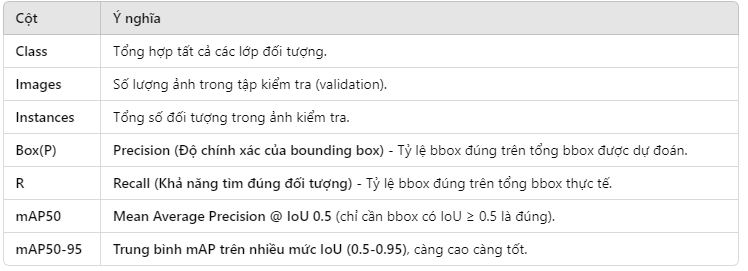

## 4. Summary model

### 4.1 Model info

In [3]:
model = YOLO(f'/{unique_save_path}/runs/detect/train/weights/best.pt')

NameError: name 'unique_save_path' is not defined

In [55]:
model_summary = model.info()
if isinstance(model_summary, tuple):
    model_summary = model_summary[0]  # Lấy phần tử đầu tiên nếu là tuple

YOLOv12s summary: 497 layers, 9,098,786 parameters, 0 gradients, 19.6 GFLOPs


In [56]:
!pip install torchinfo

Defaulting to user installation because normal site-packages is not writeable


### 4.2 Lưu khái quát mô hình

In [57]:
from torchinfo import summary
summary(model)
# Kiểm tra requires_grad của các tham số
for name, param in model.named_parameters():
    print(f"{name}: {param.requires_grad}")

Layer (type:depth-idx)                                            Param #
YOLO                                                              --
├─DetectionModel: 1-1                                             --
│    └─Sequential: 2-1                                            --
│    │    └─Conv: 3-1                                             (928)
│    │    └─Conv: 3-2                                             (9,344)
│    │    └─C3k2: 3-3                                             (26,080)
│    │    └─Conv: 3-4                                             (37,120)
│    │    └─C3k2: 3-5                                             (103,360)
│    │    └─Conv: 3-6                                             (590,336)
│    │    └─A2C2f: 3-7                                            (677,120)
│    │    └─Conv: 3-8                                             (1,180,672)
│    │    └─A2C2f: 3-9                                            (2,664,960)
│    │    └─Upsample: 3-10             

#### 4.2.1 Export excel summary model

In [ ]:
import io
import pandas as pd
from torchinfo import summary

# Giả sử model của bạn đã được định nghĩa và khởi tạo
# Ví dụ: model = MyModel(...)

# 1. Lấy model summary và lưu vào biến dưới dạng chuỗi
lines = []
def capture(line):
    lines.append(line)

# Sử dụng print_fn để capture từng dòng của summary
summary(model, print_fn=capture)
model_summary_str = "\n".join(lines)

# 2. Thu thập thông tin requires_grad của các tham số
params_data = []
for name, param in model.named_parameters():
    params_data.append({"Parameter Name": name, "Requires Grad": param.requires_grad})

# Chuyển đổi thành DataFrame
df_params = pd.DataFrame(params_data)

# 3. Tạo DataFrame cho model summary (mỗi dòng là một dòng summary)
df_summary = pd.DataFrame(model_summary_str.splitlines(), columns=["Model Summary"])

# 4. Ghi thông tin vào file Excel với 2 sheet
excel_filename = "model_report.xlsx"
with pd.ExcelWriter(excel_filename) as writer:
    df_summary.to_excel(writer, sheet_name="Model Summary", index=False)
    df_params.to_excel(writer, sheet_name="Parameters", index=False)

print(f"Đã lưu báo cáo model vào file: {excel_filename}")


#### 4.2.2 Mở khóa tham số

In [88]:
# Mở khóa toàn bộ các tham số
for param in model.model.parameters():
    param.requires_grad = True
%cd /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1/runs/detect/train/weights
model.save("unfreezed_model.pt")  # Định dạng mặc định của YOLO
# Kiểm tra lại
print(f"Trainable params: {sum(p.numel() for p in model.model.parameters() if p.requires_grad)}")

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1/runs/detect/train/weights
Trainable params: 9076530


### 4.3 Visualize các lóp của mô hình ver 1 dựa vào torchinfo

<ipython-input-13-131d7b458fae>:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


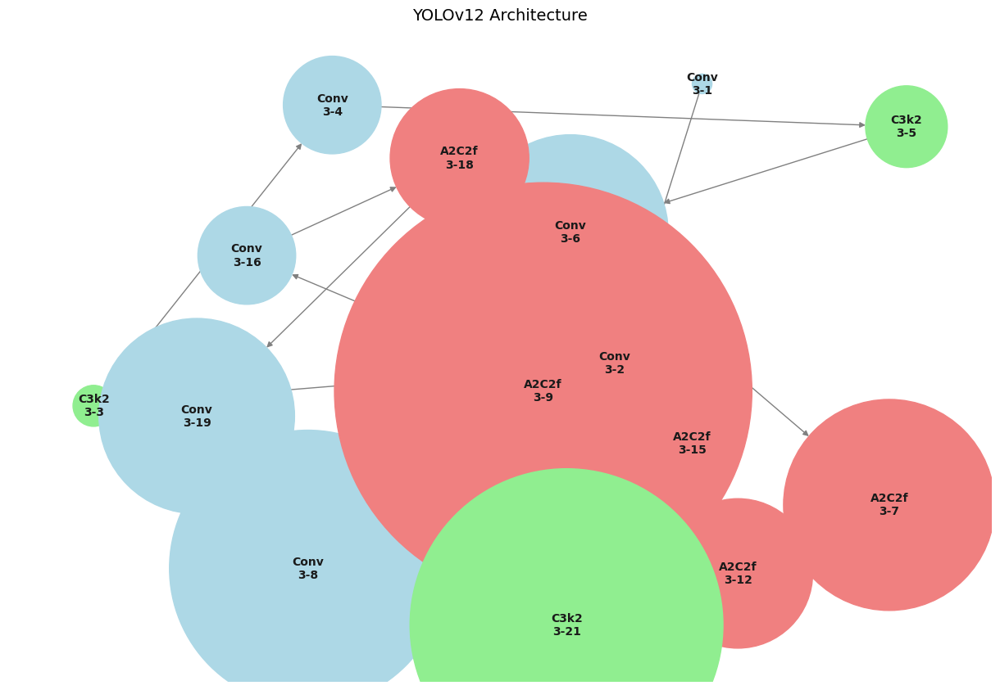

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import re

def parse_yolo_summary(summary_text):   
    """Phân tích YOLO summary thành danh sách các layers và kết nối."""
    G = nx.DiGraph()
    lines = summary_text.strip().split("\n")[2:-2]  # Bỏ dòng tiêu đề và tổng kết

    prev_layer = None  # Theo dõi lớp trước để tạo kết nối
    layer_colors = {
        'Conv': 'lightblue', 'C3k2': 'lightgreen', 'A2C2f': 'lightcoral',
        'Concat': 'orange', 'Upsample': 'purple', 'Detect': 'red'
    }

    for line in lines:
        match = re.search(r'(\w+): (\d+-\d+)\s+\(([\d,]+)?\)', line)
        if match:
            layer_type, layer_index, params = match.groups()
            params = int(params.replace(",", "")) if params else 0

            # Thêm node
            G.add_node(layer_index, label=f"{layer_type}\n{layer_index}",
                       color=layer_colors.get(layer_type, 'gray'), size=params)

            # Kết nối với lớp trước đó (giả định nối tuyến tính)
            if prev_layer:
                G.add_edge(prev_layer, layer_index)

            prev_layer = layer_index  # Cập nhật lớp trước đó

    return G

def visualize_yolo(G):
    """Vẽ sơ đồ kiến trúc YOLO."""
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42, k=1.2)

    # Kích thước node dựa trên số lượng tham số
    node_sizes = [max(300, G.nodes[n]['size'] // 20) for n in G.nodes]
    node_colors = [G.nodes[n]['color'] for n in G.nodes]

    nx.draw(G, pos, with_labels=True, labels={n: G.nodes[n]['label'] for n in G.nodes},
            node_size=node_sizes, node_color=node_colors, font_size=10,
            font_weight='bold', edge_color='gray', arrows=True)

    plt.title("YOLOv12 Architecture", fontsize=14)
    plt.tight_layout()
    plt.show()

# Dữ liệu đầu vào (copy từ bạn)
summary_text = """==========================================================================================
YOLO                                                              --
├─DetectionModel: 1-1                                             --
│    └─Sequential: 2-1                                            --
│    │    └─Conv: 3-1                                             (928)
│    │    └─Conv: 3-2                                             (18,560)
│    │    └─C3k2: 3-3                                             (26,080)
│    │    └─Conv: 3-4                                             (147,712)
│    │    └─C3k2: 3-5                                             (103,360)
│    │    └─Conv: 3-6                                             (590,336)
│    │    └─A2C2f: 3-7                                            (689,408)
│    │    └─Conv: 3-8                                             (1,180,672)
│    │    └─A2C2f: 3-9                                            (2,689,536)
│    │    └─Upsample: 3-10                                        --
│    │    └─Concat: 3-11                                          --
│    │    └─A2C2f: 3-12                                           (345,856)
│    │    └─Upsample: 3-13                                        --
│    │    └─Concat: 3-14                                          --
│    │    └─A2C2f: 3-15                                           (95,104)
│    │    └─Conv: 3-16                                            (147,712)
│    │    └─Concat: 3-17                                          --
│    │    └─A2C2f: 3-18                                           (296,704)
│    │    └─Conv: 3-19                                            (590,336)
│    │    └─Concat: 3-20                                          --
│    │    └─C3k2: 3-21                                            (1,511,424)
│    │    └─Detect: 3-22                                          (820,956)
==========================================================================================
"""

# Xử lý và vẽ sơ đồ
G = parse_yolo_summary(summary_text)
visualize_yolo(G)


## 5. Evaluate fine-tuned YOLOv12 model

- Mục đích: Đảm bảo mã hóa ký tự UTF-8 được sử dụng mặc định
Giải quyết các vấn đề encoding khi làm việc với các ký tự quốc tế, đặc biệt là tiếng Việt

In [42]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {unique_save_path}/runs/detect/train/

args.yaml			 PR_curve.png	   val_batch0_labels.jpg
confusion_matrix_normalized.png  R_curve.png	   val_batch0_pred.jpg
confusion_matrix.png		 results.csv	   val_batch1_labels.jpg
F1_curve.png			 results.png	   val_batch1_pred.jpg
labels_correlogram.jpg		 train_batch0.jpg  weights
labels.jpg			 train_batch1.jpg
P_curve.png			 train_batch2.jpg


### 5.1 Matrix confuse

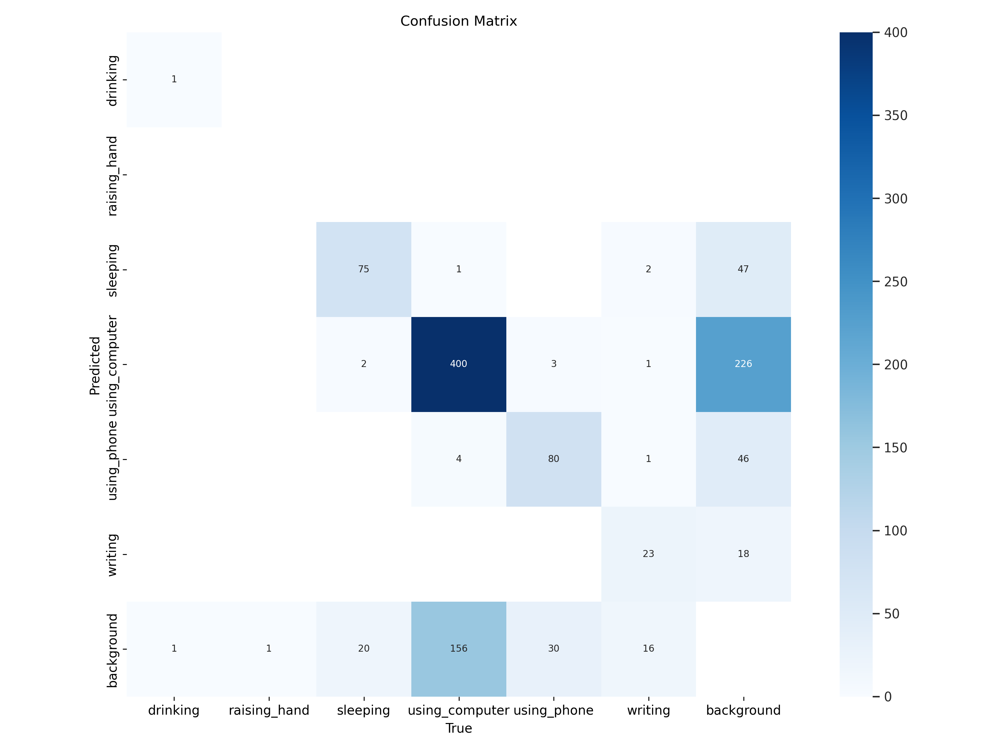

In [43]:
from IPython.display import Image

Image(filename=f'{unique_save_path}/runs/detect/train/confusion_matrix.png', width=1000)

### 5.2 Biểu bồ hàm mất mát và precision, recall, mAP

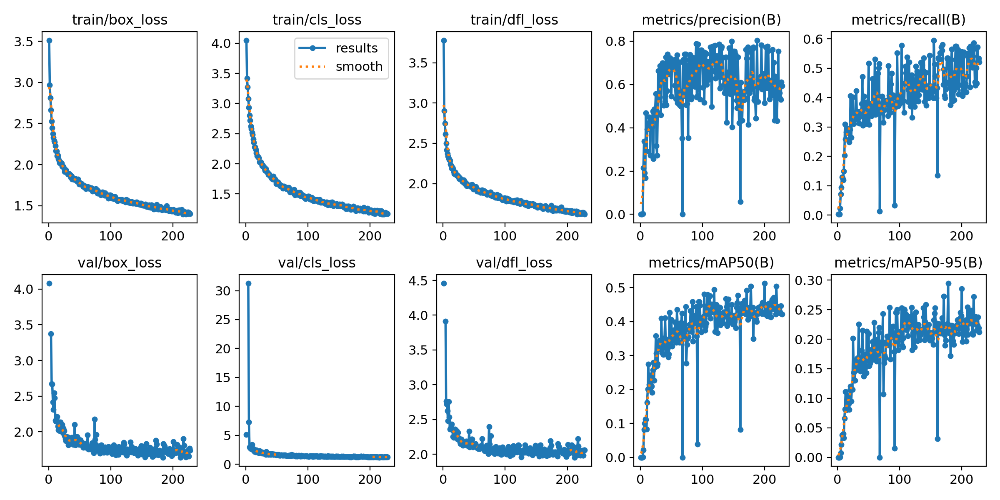

In [28]:
from IPython.display import Image
Image(filename=f'{unique_save_path}/runs/detect/train/results.png', width=1000)

Hàng trên (Train Loss & Metrics)

train/box_loss, train/cls_loss, train/dfl_loss: Các tổn thất (loss) trong quá trình huấn luyện, càng giảm càng tốt.

metrics/precision(B), metrics/recall(B): Precision và Recall đo lường độ chính

xác của mô hình trong việc phát hiện đối tượng.

In [8]:
data_path_working = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-2"
print(data_path_working)

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-2


### 5.3 Danh sách lớp

In [9]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{data_path_working}/test/images",
    annotations_directory_path=f"{data_path_working}/test/labels",
    data_yaml_path=f"{data_path_working}/data.yaml"
)

ds.classes

['drinking',
 'raising_hand',
 'sleeping',
 'using_computer',
 'using_phone',
 'writing']

In [4]:
import supervision
print(supervision.__version__)


0.25.1


In [91]:
pip install --upgrade supervision

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


### 5.4 Biểu đồ mAP

In [16]:
from supervision.metrics.mean_average_precision import MeanAveragePrecision  # Sửa đường dẫn import

model = YOLO(f'/{unique_save_path}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

# Giả sử ds là tập dữ liệu (dataset) của bạn
for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    
    predictions.append(detections)
    targets.append(target)

# Tính toán Mean Average Precision (mAP)
map_result = MeanAveragePrecision().update(predictions, targets).compute()

print("Mean Average Precision (mAP):", map_result)


Mean Average Precision (mAP): MeanAveragePrecisionResult:
Metric target: MetricTarget.BOXES
Class agnostic: False
mAP @ 50:95: 0.4263
mAP @ 50:    0.7027
mAP @ 75:    0.4226
mAP scores: [    0.70268     0.69913     0.69398     0.65558     0.57334     0.42262     0.23736     0.16111     0.11725  0.00019802]
IoU thresh: [        0.5        0.55         0.6        0.65         0.7        0.75         0.8        0.85         0.9        0.95]
AP per class:
  0: [    0.49505     0.49505     0.49505     0.49505     0.49505     0.49505     0.49505     0.49505     0.49505           0]
  2: [    0.81951     0.81951     0.81951     0.77164     0.59312     0.29887     0.11175    0.035961    0.010184   0.0009901]
  3: [    0.79821     0.78049     0.75475     0.68095     0.53327     0.35875     0.18148    0.060832   0.0072933           0]
  4: [    0.68374     0.68374     0.68374     0.65908     0.65908     0.58439     0.26881     0.12363    0.025226           0]
  5: [    0.71687     0.71687     0.

 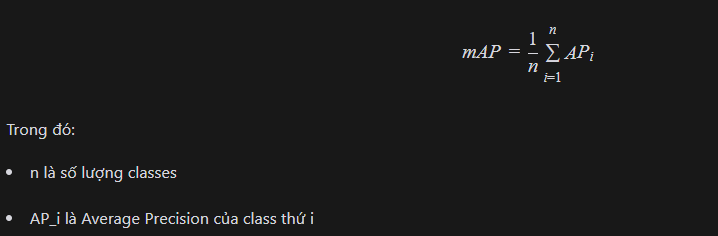

### Vẽ map

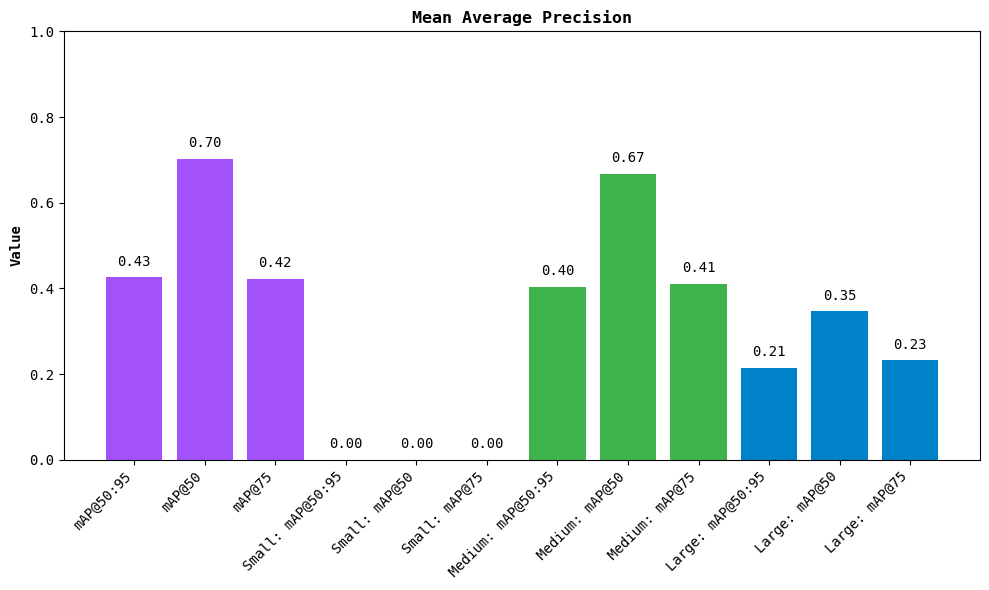

In [15]:
map_result.plot()

## 6 Run inference with fine-tuned YOLOv12 model

In [6]:
unique_save_path= "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1"

In [33]:
print(f'Đường dẫn: {unique_save_path}')

Đường dẫn: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1


In [37]:
import supervision as sv

model = YOLO(f'/{unique_save_path}/runs/detect/train/weights/best.pt')

### 6.1 Test one image random

Image path: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-2/test/images/13_21_39-13_25_00-M-0-0-0-_frame_0010_png.rf.3e331045b3251c9f5b7062c5842777f1.jpg
 image: [[[ 35  35  35]
  [ 37  37  37]
  [ 38  38  38]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 37  37  37]
  [ 50  50  50]
  [ 39  39  39]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 [[ 44  44  44]
  [ 51  51  51]
  [ 33  33  33]
  ...
  [ 42  42  42]
  [ 42  42  42]
  [ 42  42  42]]

 ...

 [[ 70  70  70]
  [ 72  72  72]
  [ 83  83  83]
  ...
  [170 170 170]
  [155 155 155]
  [126 126 126]]

 [[ 68  68  68]
  [ 69  69  69]
  [ 78  78  78]
  ...
  [167 167 167]
  [153 153 153]
  [130 130 130]]

 [[ 66  66  66]
  [ 66  66  66]
  [ 75  75  75]
  ...
  [161 161 161]
  [150 150 150]
  [134 134 134]]]
 target: Detections(xyxy=array([[     143.25,       81.25,      209.75,      189.75],
       [     217.75,          93,      277.25,         153],
       [  

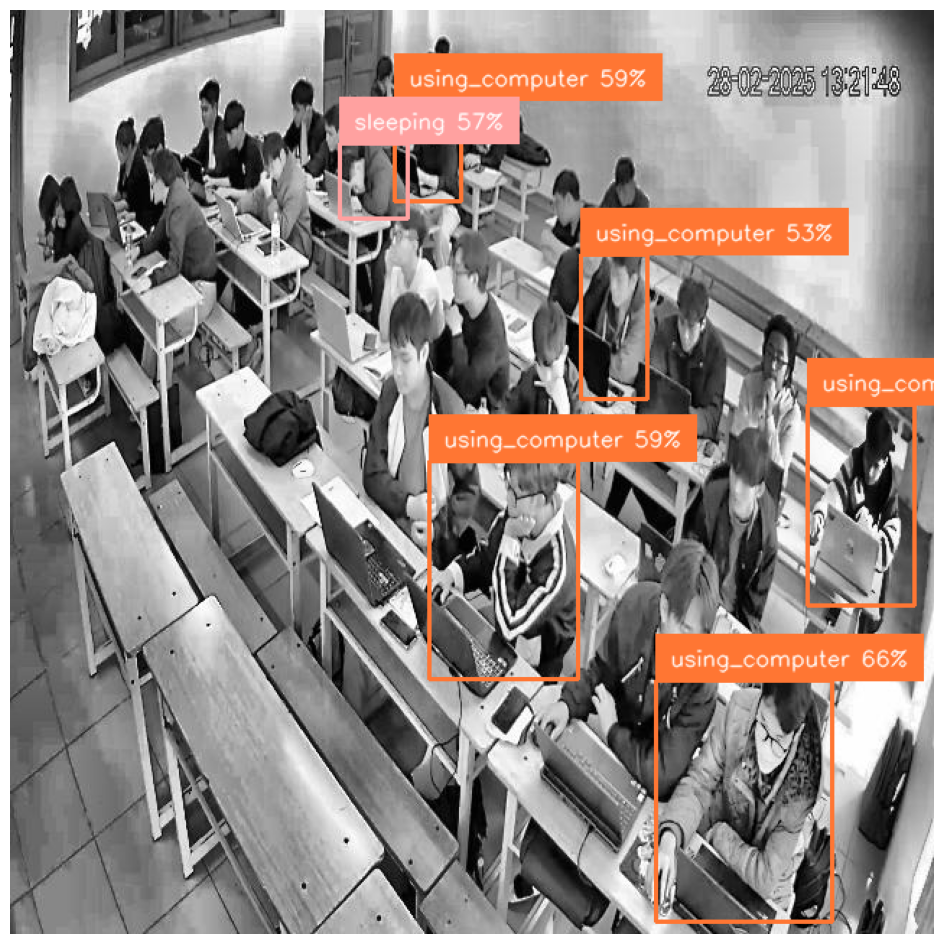

In [17]:
'''
Ý tưởng:
Lấy một hình ảnh ngẫu nhiên từ tập dữ liệu.
Dự đoán đối tượng trên ảnh bằng mô hình YOLO.
Áp dụng NMS để loại bỏ các phát hiện trùng lặp.
Vẽ hộp giới hạn và nhãn lên ảnh.
Hiển thị ảnh đã được chú thích.
'''
import random

# Lấy ngẫu nhiên ảnh từ dataset
i = random.randint(0, len(ds))
image_path, image, target = ds[i]
print(f'Image path: {image_path}\n image: {image}\n target: {target}')

results = model(image, verbose=False)[0]
print(f'Result: {results}')
detections = sv.Detections.from_ultralytics(results).with_nms()
print('Display detections:', detections)
thread = 50/100
detections = detections[detections.confidence > thread]

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

# Tạo labels kết hợp class name và confidence
labels = [
    f"{model.names[class_id]} {confidence:.0%}"  # Sử dụng model.names thay vì ds.names
    for class_id, confidence in
    zip(detections.class_id, detections.confidence)
]

annotated_image = image.copy()

# Vẽ bounding boxes và labels
annotated_image = box_annotator.annotate(
    scene=annotated_image,
    detections=detections
)
annotated_image = label_annotator.annotate(
    scene=annotated_image,
    detections=detections,
    labels=labels  # Thêm labels vào đây
)

sv.plot_image(annotated_image)


Thông số	Ưu tiên	Lý do

Inference Time	⭐⭐⭐⭐	Ảnh hưởng trực tiếp đến FPS và khả năng real-time.

Total Latency	⭐⭐⭐⭐	Phản ánh độ trễ thực tế của toàn pipeline.

Preprocess	⭐⭐	Có thể tối ưu bằng phần cứng hoặc code.

Postprocess	⭐	Thường không phải nút cổ chai nếu đơn giản.

### 6.2 Phân bổ kích thước chuẩn hóa
**Ý nghĩa:**

Trục x/y: Thể hiện tỷ lệ kích thước (width/height) của các đối tượng so với kích thước ảnh gốc, được chuẩn hóa trong khoảng [0, 1].

Các giá trị số (0.0, 0.2, 0.4,...): Mật độ xuất hiện của các đối tượng ở từng khoảng kích thước

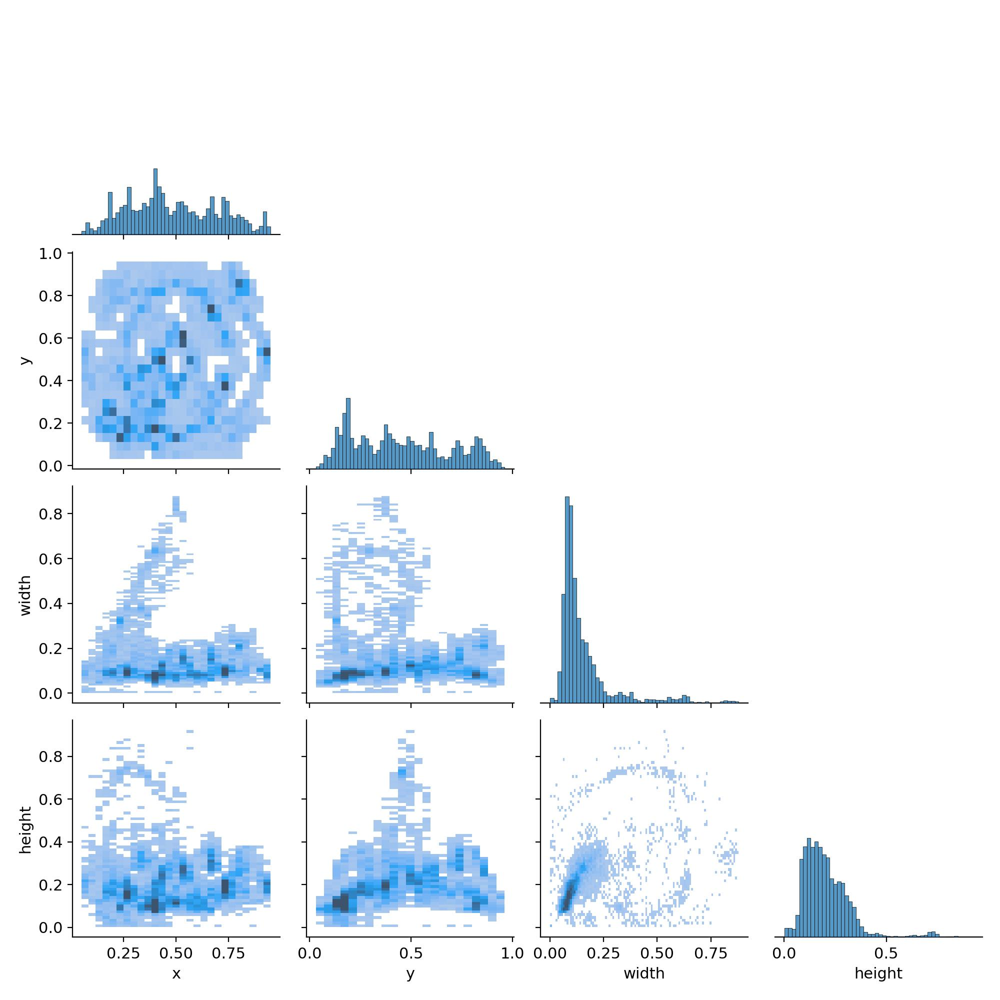

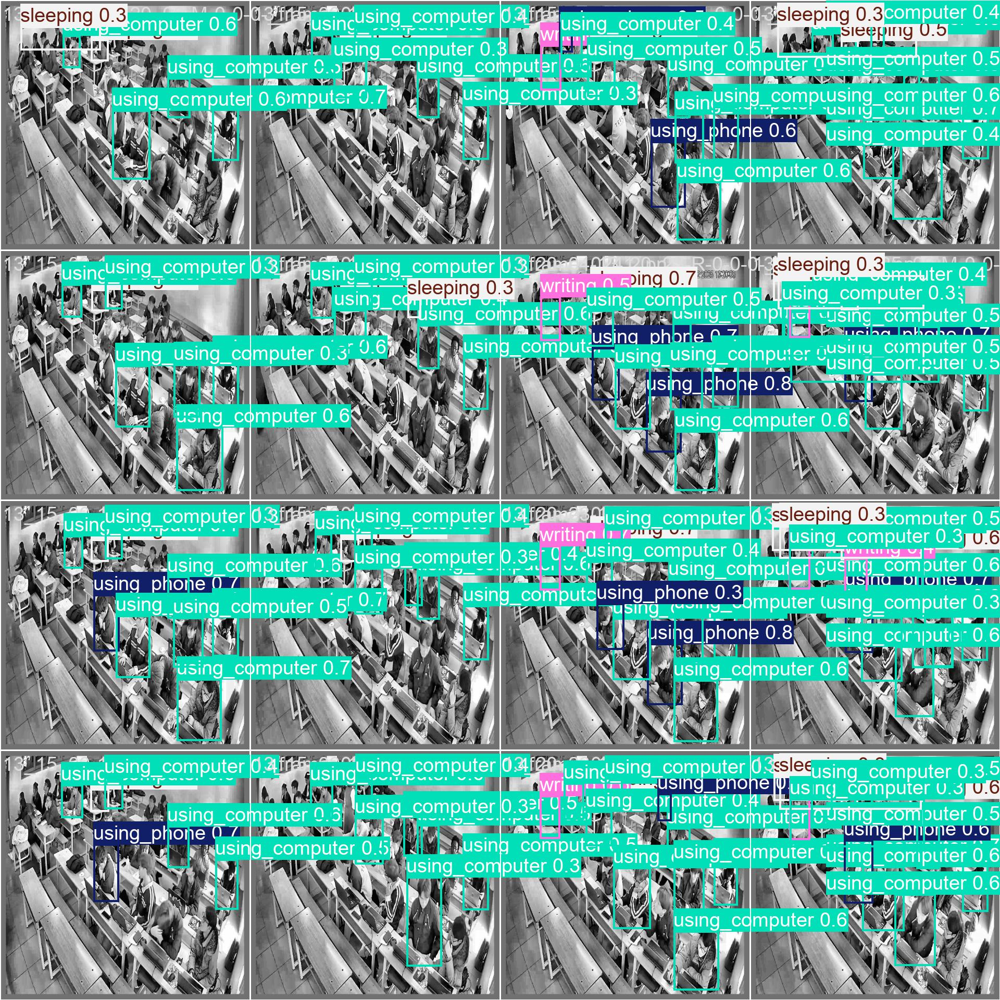

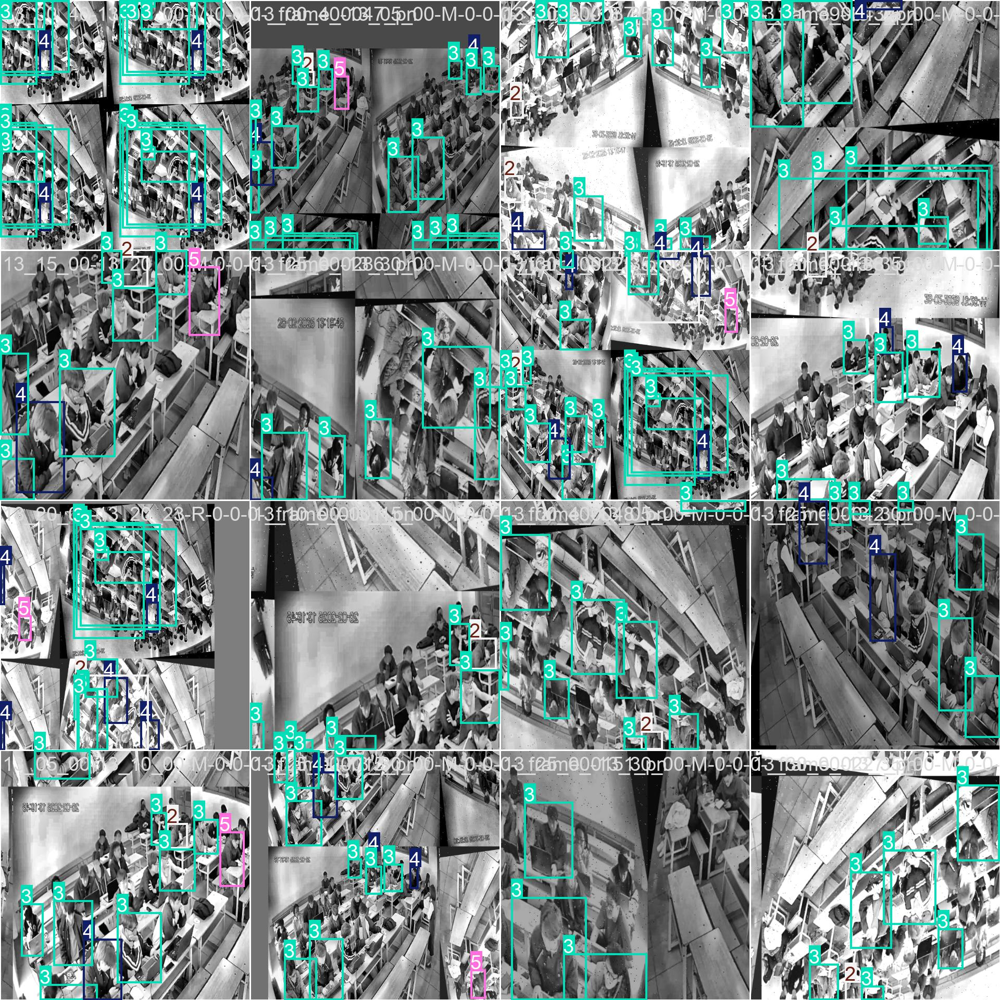

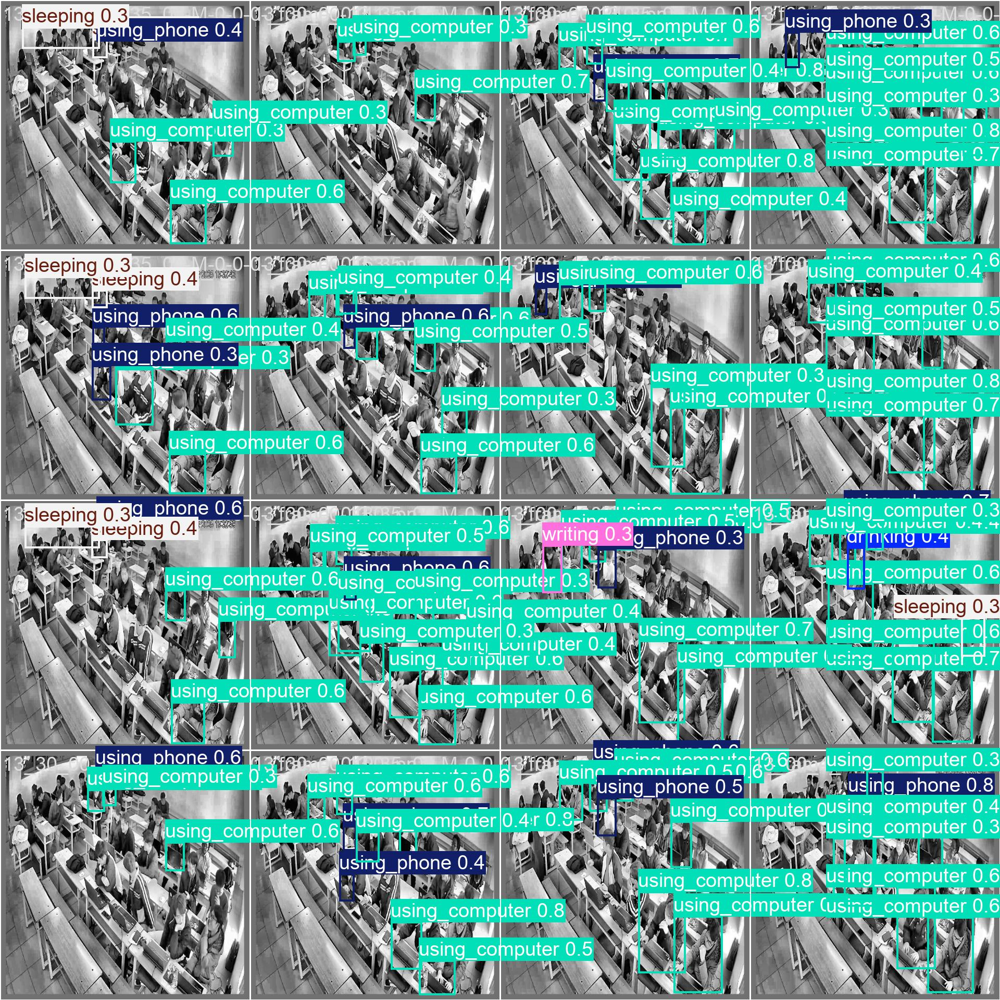

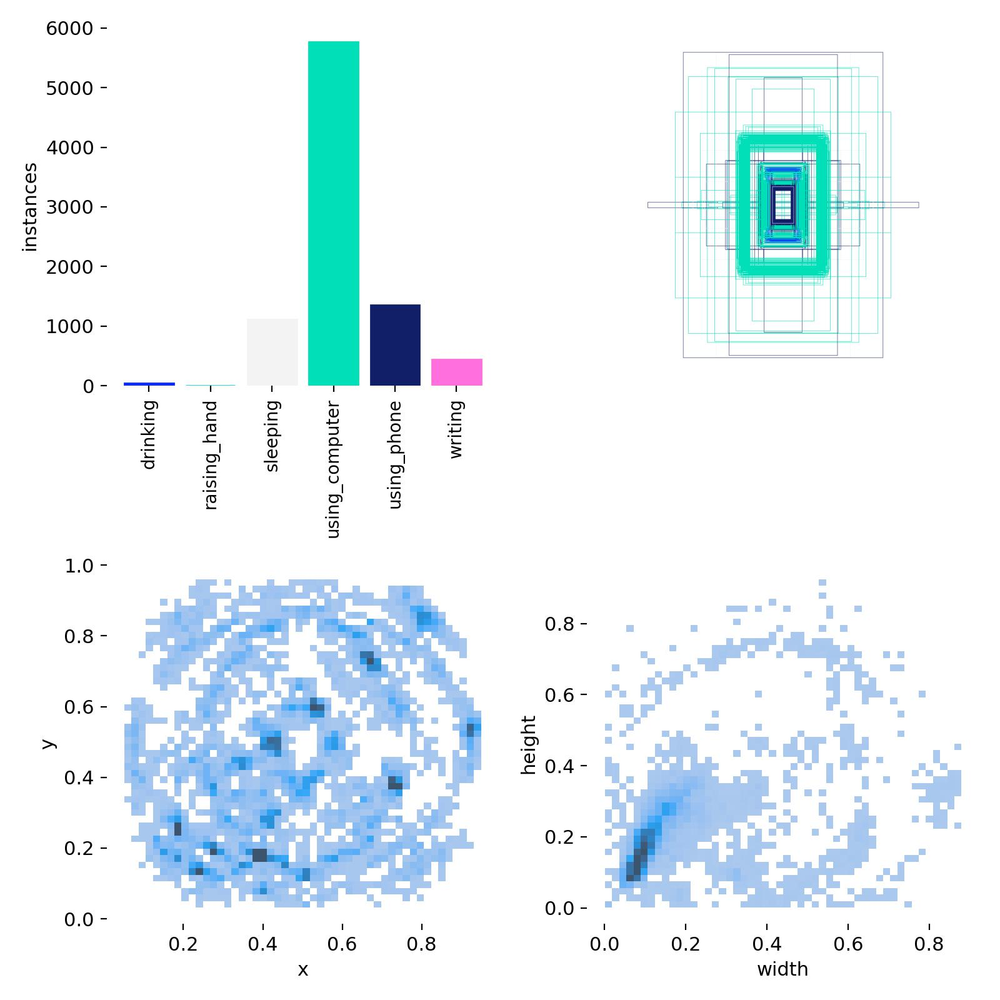

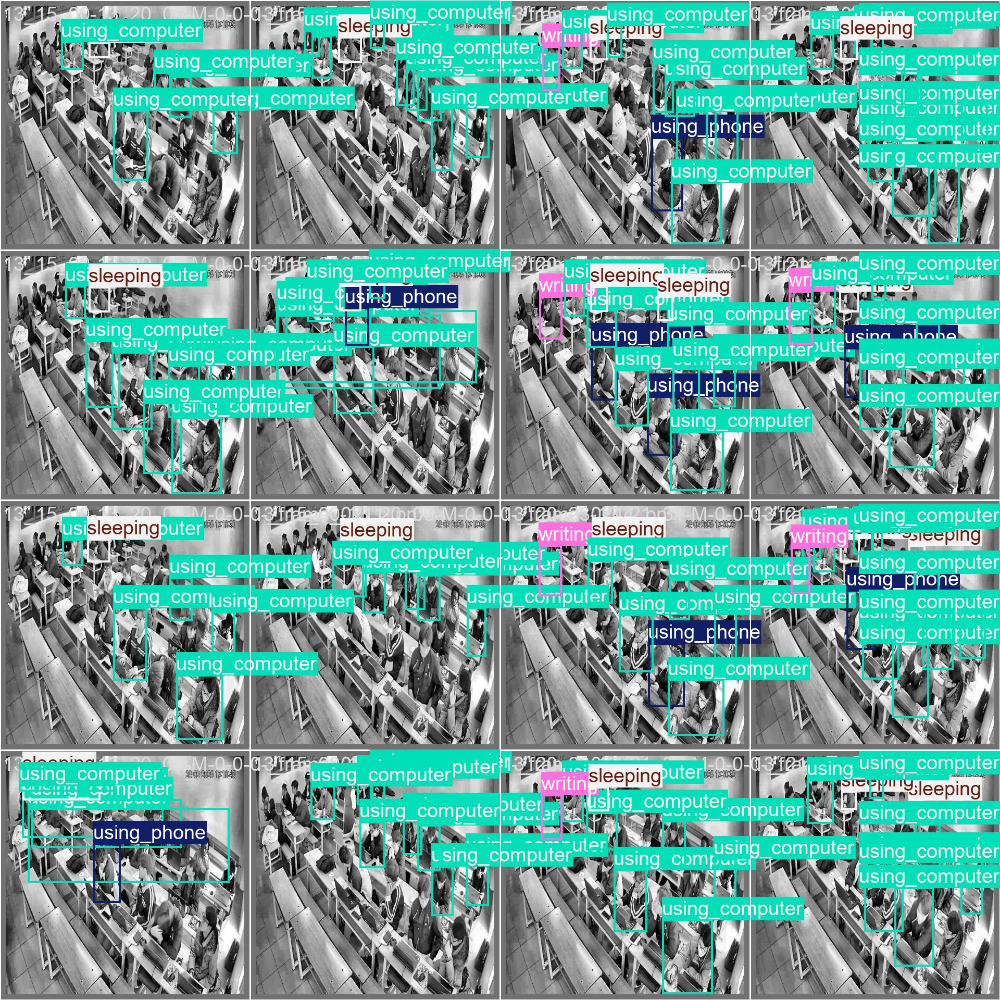

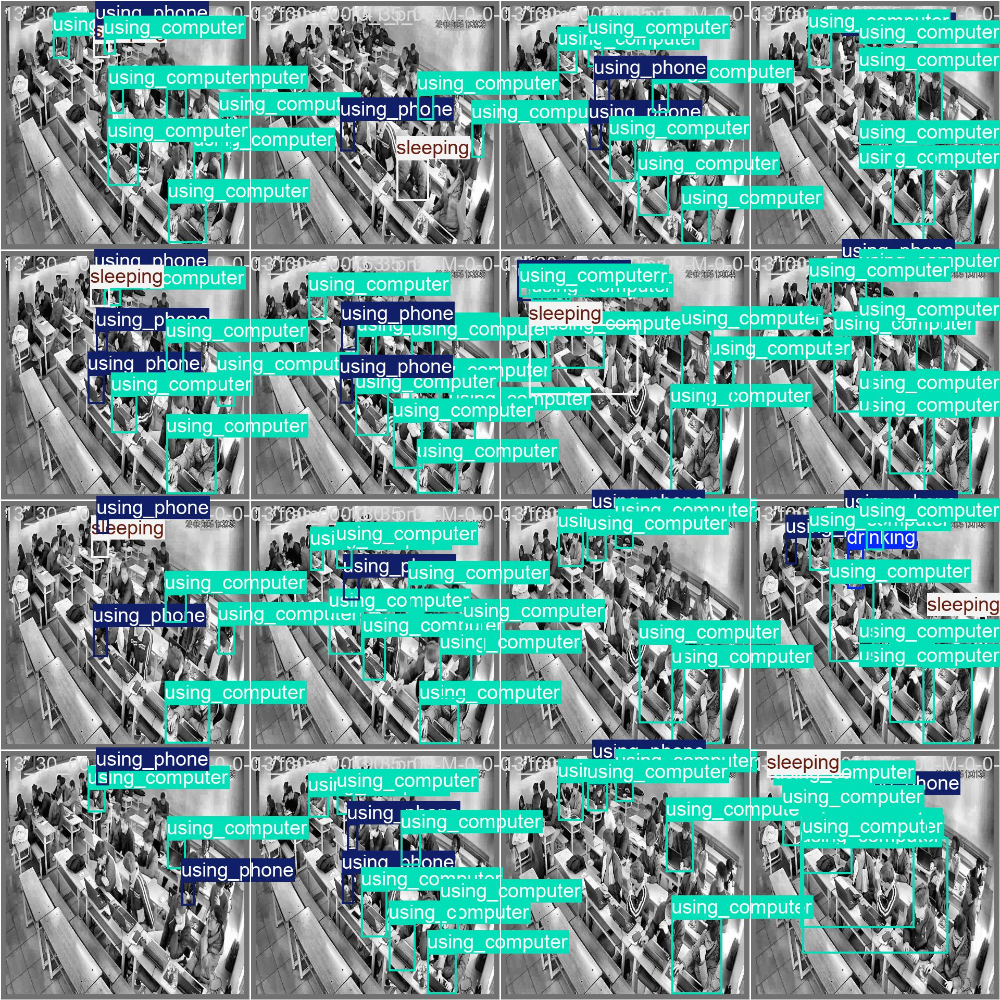

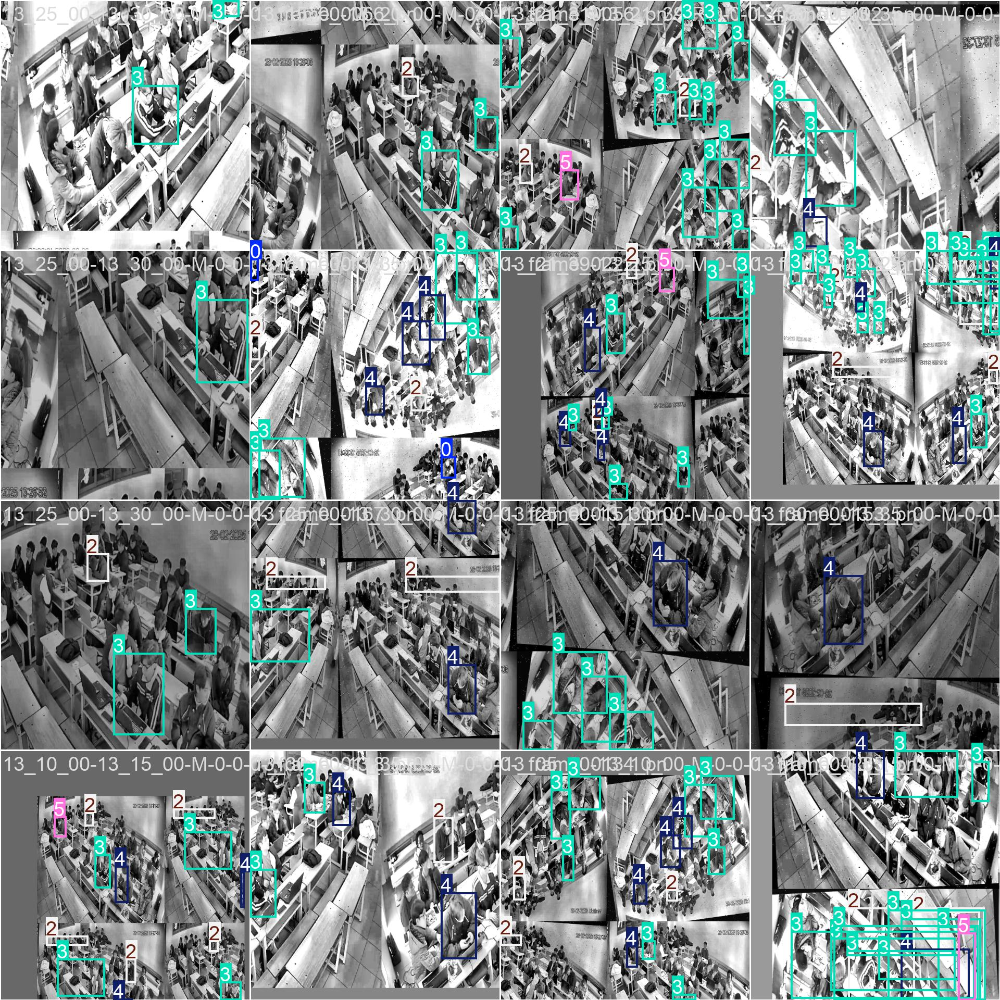

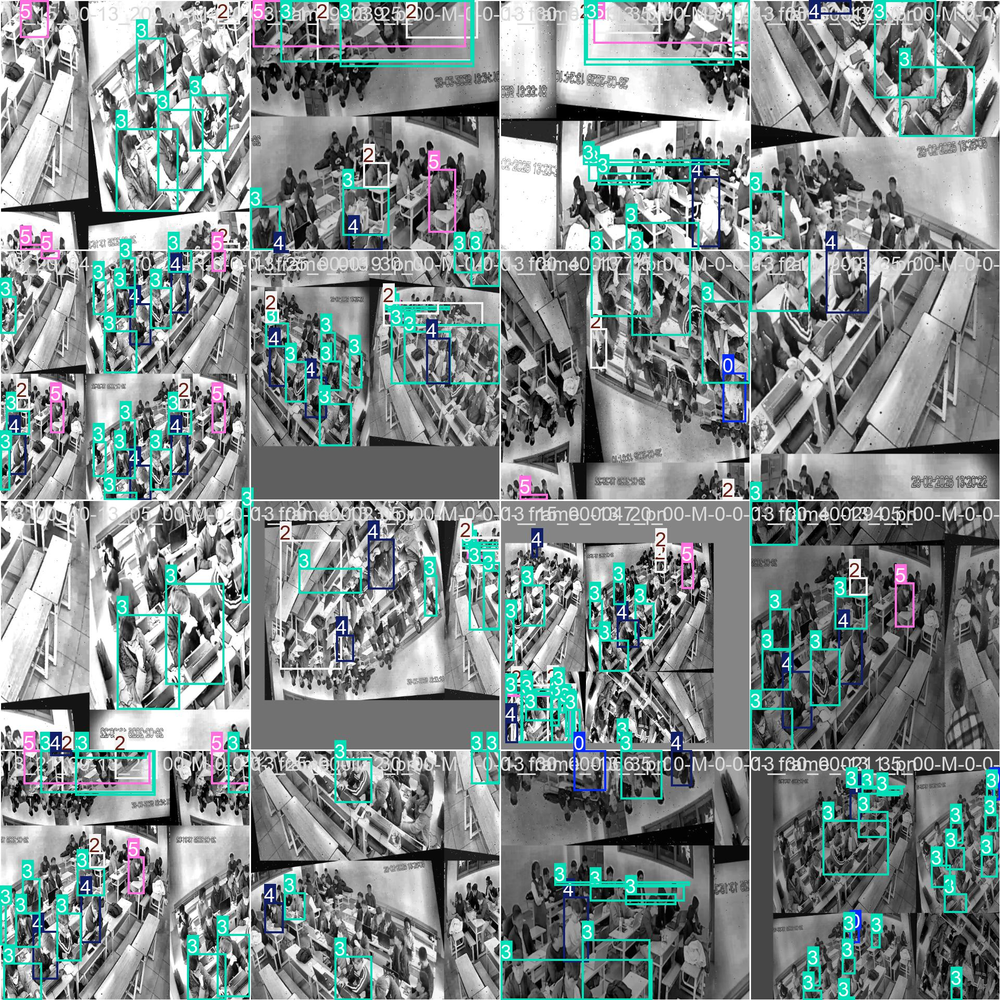

In [37]:
import glob
from IPython.display import Image, display

for imageName in glob.glob(f'{unique_save_path}/runs/detect/train/*.jpg')[:10]: #assuming JPG
    display(Image(filename=imageName))

### 6.3 Run inference ( Test model )

In the example, we're using the `yolov12l.pt` model, but you can experiment with different model sizes by simply swapping out the model name during initialization. Options include `yolov12n.pt`, `yolov12s.pt`, `yolov12m.pt`, `yolov12l.pt`, and `yolov12x.pt`.

In [ ]:
import os
import time
import torch
from ultralytics import YOLO

# ----------------- CẤU HÌNH -----------------
# Cập nhật đường dẫn cho phù hợp với hệ thống của bạn
unique_save_path = "your_unique_save_path"  # Ví dụ: "runs/detect/train"
model_path = f'/{unique_save_path}/runs/detect/train/weights/best.pt'
data_yaml = "/path/to/your/data.yaml"  # Đường dẫn đến file data.yaml chứa thông tin về dataset (train, valid, test)

# Load model từ file best.pt
model = YOLO(model_path)

# ----------------- THỐNG KÊ THAM SỐ MODEL -----------------
def count_parameters(model):
    """
    Đếm tổng số tham số và số tham số trainable của model.
    """
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

total_params, trainable_params = count_parameters(model)
model_file_size = os.path.getsize(model_path) / (1024 * 1024)  # MB

# ----------------- ĐO THỜI GIAN INFERENCE & THROUGHPUT -----------------
# Chọn thiết bị: GPU nếu có, ngược lại CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Tạo dummy input (giả sử kích thước đầu vào: 640x640, 3 kênh)
dummy_input = torch.randn(1, 3, 640, 640).to(device)
model.eval()

# Warm-up để ổn định thời gian inference
with torch.no_grad():
    for _ in range(5):
        _ = model(dummy_input)

# Đo thời gian cho một forward pass
with torch.no_grad():
    start_time = time.time()
    _ = model(dummy_input)
    end_time = time.time()
inference_time_ms = (end_time - start_time) * 1000  # tính theo mili-giây
throughput = 1000 / inference_time_ms if inference_time_ms > 0 else None  # số ảnh/giây

# ----------------- ĐÁNH GIÁ MODEL (TÍNH mAP50 và mAP50:90) -----------------
# Lưu ý: Ultralytics YOLO hiện thường trả về mAP50 và mAP50-95.
# Ở đây, nếu không có mAP50:90 riêng, ta sẽ lấy mAP50-95 làm giá trị gần đúng.
try:
    # model.val() sẽ đánh giá model trên tập validation được định nghĩa trong data.yaml
    results = model.val(data=data_yaml, verbose=False)
    # Giả sử kết quả trả về chứa dictionary metrics với các key sau:
    # "metrics/mAP50": [value] và "metrics/mAP50-95": [value]
    mAP50 = results.metrics.get("metrics/mAP50", [0])[0] * 100  # chuyển thành %
    mAP50_95 = results.metrics.get("metrics/mAP50-95", [0])[0] * 100
    # Nếu muốn mAP50:90, bạn có thể tính riêng nếu có dữ liệu các ngưỡng IoU;
    # Ở đây, ta gán mAP50:90 bằng mAP50-95 (hoặc thay đổi theo yêu cầu cụ thể)
    mAP50_90 = mAP50_95  
except Exception as e:
    print("Lỗi trong quá trình đánh giá mAP:", e)
    mAP50 = None
    mAP50_90 = None

# ----------------- IN KẾT QUẢ -----------------
print("=== THÔNG SỐ MODEL ===")
print(f"Model path           : {model_path}")
print(f"Model file size      : {model_file_size:.2f} MB")
print(f"Total parameters     : {total_params:,}")
print(f"Trainable parameters : {trainable_params:,}")
print(f"Inference time       : {inference_time_ms:.2f} ms (cho 1 forward pass)")
print(f"Inference throughput : {throughput:.2f} images/s" if throughput is not None else "Inference throughput: N/A")
print(f"mAP50                : {mAP50:.2f}%" if mAP50 is not None else "mAP50                : N/A")
print(f"mAP50:90             : {mAP50_90:.2f}%" if mAP50_90 is not None else "mAP50:90             : N/A")


## 7 Test tệp dữ liệu dataset của test

### 7.1 Muốn biết nhãn sai và nhãn đúng là gì?

In [90]:
import os
import cv2
from ultralytics import YOLO
import supervision as sv
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

# ----------------- CẤU HÌNH ĐƯỜNG DẪN -----------------
# ----------------- CẤU HÌNH ĐƯỜNG DẪN -----------------
unique_save_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1"  # Thay bằng đường dẫn thực tế đến thư mục chứa mô hình
data_path_working = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset"  # Thay bằng đường dẫn thực tế đến thư mục chứa dữ liệu

# Thư mục chứa ảnh và ground truth (annotation) theo định dạng YOLO
image_dir = os.path.join(data_path_working, "Student-Behavior-Recognition-2/test/images")
gt_dir = os.path.join(data_path_working, "Student-Behavior-Recognition-2/test/labels")

# Thư mục để export những ảnh có dự đoán sai
export_folder = os.path.join(unique_save_path, "wrong_predictions")
os.makedirs(export_folder, exist_ok=True)

# ----------------- HÀM HỖ TRỢ -----------------
def compute_iou(box1, box2):
    """
    Tính IoU giữa 2 bounding box với định dạng [x1, y1, x2, y2].
    """
    x_left = max(box1[0], box2[0])
    y_top = max(box1[1], box2[1])
    x_right = min(box1[2], box2[2])
    y_bottom = min(box1[3], box2[3])
    
    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    
    iou = intersection_area / float(box1_area + box2_area - intersection_area)
    return iou

def parse_ground_truth(gt_file, img_width, img_height):
    """
    Đọc file annotation định dạng YOLO:
      Mỗi dòng: <class_id> <x_center> <y_center> <width> <height>
    Các giá trị được chuẩn hóa theo kích thước ảnh, chuyển đổi sang định dạng [x1, y1, x2, y2].
    Trả về danh sách các tuple: (box, class_id)
    """
    items = []
    if not os.path.exists(gt_file):
        return items
    with open(gt_file, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(parts[0])
            x_center = float(parts[1])
            y_center = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            x1 = int((x_center - width/2) * img_width)
            y1 = int((y_center - height/2) * img_height)
            x2 = int((x_center + width/2) * img_width)
            y2 = int((y_center + height/2) * img_height)
            items.append(([x1, y1, x2, y2], cls))
    return items

# ----------------- LẤY DANH SÁCH ẢNH -----------------
image_files = [
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

# ----------------- KHỞI TẠO MÔ HÌNH -----------------
model_path = os.path.join(unique_save_path, "runs/detect/train/weights/unfreezed_model.pt")
model = YOLO(model_path)

# Annotators để vẽ bounding box và label (nếu cần)
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

# ----------------- BIẾN THỐNG KÊ -----------------
global_TP = 0
global_FP = 0
global_FN = 0
iou_threshold = 0.5  # Ngưỡng IoU để xác định matching
wrong_images_list = []  # Lưu các ảnh có dự đoán sai

# ----------------- XỬ LÝ ẢNH -----------------
for image_path in image_files:
    # Đọc ảnh
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không đọc được ảnh: {image_path}")
        continue
    img_height, img_width = image.shape[:2]
    
    # Chạy mô hình YOLO để dự đoán
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    
    # Lấy danh sách bounding box dự đoán và class_id dự đoán
    pred_boxes = detections.xyxy if hasattr(detections, "xyxy") else []
    pred_class_ids = detections.class_id if hasattr(detections, "class_id") else []
    
    # Lấy ground truth từ file .txt tương ứng (với cả box và true class)
    base_filename = os.path.splitext(os.path.basename(image_path))[0]
    gt_file = os.path.join(gt_dir, base_filename + ".txt")
    gt_items = parse_ground_truth(gt_file, img_width, img_height)
    
    TP_img = 0
    FP_img = 0
    misclassified_boxes = []  # Lưu tuple: (box, predicted_label, true_label)
    false_positive_boxes = [] # Nếu không có matching ground truth
    matched_gt = [False] * len(gt_items)
    
    for i, pred_box in enumerate(pred_boxes):
        best_iou = 0
        best_idx = -1
        for idx, (gt_box, gt_cls) in enumerate(gt_items):
            if matched_gt[idx]:
                continue
            iou = compute_iou(pred_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_idx = idx
        # Lấy nhãn dự đoán sử dụng .get() để đảm bảo trả về đúng true label nếu có
        if i < len(pred_class_ids):
            cid = int(pred_class_ids[i])
            predicted_label = model.names.get(cid, str(cid)) if hasattr(model, "names") else str(cid)
        else:
            predicted_label = "unknown"
        if best_iou >= iou_threshold and best_idx != -1:
            gt_cls = gt_items[best_idx][1]
            true_label = model.names.get(gt_cls, str(gt_cls)) if hasattr(model, "names") else str(gt_cls)
            matched_gt[best_idx] = True
            if predicted_label == true_label:
                TP_img += 1
            else:
                FP_img += 1
                misclassified_boxes.append((pred_box, predicted_label, true_label))
        else:
            FP_img += 1
            false_positive_boxes.append((pred_box, predicted_label, "none"))
    
    FN_img = len(gt_items) - TP_img
    global_TP += TP_img
    global_FP += FP_img
    global_FN += FN_img

    # Nếu có lỗi (FP hoặc FN > 0), export ảnh đã annotate
    if FP_img > 0 or FN_img > 0:
        wrong_images_list.append(image_path)
        annotated_image = image.copy()
        annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)
        
        # Với mỗi box bị phân loại sai, annotate chữ "predicted_label - true_label" ngay phía trên bounding box
        for box, predicted_label, true_label in misclassified_boxes:
            x1, y1, x2, y2 = map(int, box)
            pos_y = y1 - 10 if y1 - 10 > 10 else y1 + 20
            text = f"{predicted_label} - 0"
            cv2.putText(annotated_image, text, (x1, pos_y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        
        # Nếu muốn annotate các false positive không có matching ground truth, uncomment đoạn bên dưới:
        # for box, predicted_label, _ in false_positive_boxes:
        #     x1, y1, x2, y2 = map(int, box)
        #     pos_y = y1 - 10 if y1 - 10 > 10 else y1 + 20
        #     text = f"{predicted_label} - none"
        #     cv2.putText(annotated_image, text, (x1, pos_y),
        #                 cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        
        export_path = os.path.join(export_folder, os.path.basename(image_path))
        cv2.imwrite(export_path, annotated_image)
        print(f"Exported wrong prediction: {os.path.basename(image_path)}")

# ----------------- TỔNG KẾT -----------------
print("\n------------------ KẾT QUẢ ------------------")
print("Số ảnh đã xử lý:", len(image_files))
print("Số ảnh có dự đoán sai:", len(wrong_images_list))
print(f"Tổng TP: {global_TP}, Tổng FP: {global_FP}, Tổng FN: {global_FN}")

precision_overall = global_TP / (global_TP + global_FP) if (global_TP + global_FP) > 0 else 0
recall_overall = global_TP / (global_TP + global_FN) if (global_TP + global_FN) > 0 else 0
f1_overall = 2 * precision_overall * recall_overall / (precision_overall + recall_overall) if (precision_overall + recall_overall) > 0 else 0

print(f"Độ chính xác tổng thể (Precision): {precision_overall:.2f}")
print(f"Độ nhạy (Recall): {recall_overall:.2f}")
print(f"F1-score: {f1_overall:.2f}")


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Exported wrong prediction: 13_00_40-13_05_00-M-0-0-0-_frame_0035_png.rf.8443764195dd9f8b3378762dd4569426.jpg
Exported wrong prediction: 13_30_00-13_35_00-M-0-0-0-_frame_0023_png.rf.6e404e2e9cfb37a1ee3b37bfe7e33b73.jpg
Exported wrong prediction: 13_05_00-13_10_00-M-0-0-0-_frame_0244_png.rf.999c1e028a510c004490017c1019c2ba.jpg
Exported wrong prediction: 13_00_40-13_05_00-M-0-0-0-_frame_0116_png.rf.746cb41e2cf54b316ca2da9d62ba08ae.jpg
Exported wrong prediction: 13_05_00-13_10_00-M-0-0-0-_frame_0207_png.rf.7a338af66e022903fe585b8d197ae8dd.jpg
Exported wrong prediction: 13_15_00-13_20_00-M-0-0-0-_frame_0143_png.rf.cdd4750db0f3704cd26b54b55a5e93ff.jpg
Exported wrong prediction: 13_10_00-13_15_00-M-0-0-0-_frame_0137_png.rf.b09e45220bee25bb8177c66dcbb1da7a.jpg
Exported wrong prediction: 13_21_39-13_25_00-M-0-0-0-_frame_0107_png.rf.25c46d92737b3264a47c57ff17348335.jpg
Exported wrong prediction: 13_05_00-13_10_00-M-0-0-0-_frame_0004_png.rf.b004fffb98c6b76dae790cba08874422.jpg
Exported wrong pred

### 7.2 Sửa Claude (Ver 2) chatgpt support

In [84]:
import os                     # Thư viện thao tác với hệ thống file
import cv2                    # Thư viện xử lý ảnh
import numpy as np            # Thư viện xử lý số liệu
from ultralytics import YOLO   # Import mô hình YOLO từ ultralytics
import supervision as sv      # Thư viện hỗ trợ giám sát (nếu cần)
import json                   # Thư viện xử lý JSON
import shutil                 # Thư viện hỗ trợ sao chép file, di chuyển file,...
from datetime import datetime # Thư viện làm việc với thời gian

# ----------------- CẤU HÌNH ĐƯỜNG DẪN -----------------
# Đường dẫn đến file mô hình đã huấn luyện
model_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s10032025_ver-dataset2/_ver1/runs/detect/train/weights/best.pt"
# Đường dẫn đến thư mục chứa dữ liệu (ảnh và file nhãn ground truth)
data_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-2/test"

# Đường dẫn đến thư mục chứa ảnh và nhãn
image_dir = os.path.join(data_path, "images")
gt_dir = os.path.join(data_path, "labels")

# Tạo thư mục xuất ảnh có dự đoán sai với tên dựa trên thời gian hiện tại
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
export_base_folder = f"wrong_predictions_{timestamp}"
os.makedirs(export_base_folder, exist_ok=True)

# Tạo các thư mục con cho từng loại lỗi: false positives, false negatives, class errors
false_positive_dir = os.path.join(export_base_folder, "false_positives")
false_negative_dir = os.path.join(export_base_folder, "false_negatives")
class_error_dir = os.path.join(export_base_folder, "class_errors")

for dir_path in [false_positive_dir, false_negative_dir, class_error_dir]:
    os.makedirs(dir_path, exist_ok=True)

# ----------------- HÀM HỖ TRỢ -----------------
def convert_yolo_to_xyxy(yolo_box, img_width, img_height):
    """
    Chuyển đổi bounding box từ định dạng YOLO (x_center, y_center, width, height)
    sang định dạng (x1, y1, x2, y2) theo kích thước ảnh.
    """
    x_center, y_center, width, height = yolo_box  # Lấy giá trị tọa độ trung tâm và kích thước box
    x1 = int((x_center - width/2) * img_width)      # Tính x1
    y1 = int((y_center - height/2) * img_height)      # Tính y1
    x2 = int((x_center + width/2) * img_width)        # Tính x2
    y2 = int((y_center + height/2) * img_height)        # Tính y2
    return [x1, y1, x2, y2]

def compute_iou(box1, box2):
    """
    Tính Intersection over Union (IoU) giữa hai bounding box theo định dạng [x1, y1, x2, y2].
    """
    x_left = max(box1[0], box2[0])   # Tọa độ x của điểm giao nhau bên trái
    y_top = max(box1[1], box2[1])    # Tọa độ y của điểm giao nhau phía trên
    x_right = min(box1[2], box2[2])  # Tọa độ x của điểm giao nhau bên phải
    y_bottom = min(box1[3], box2[3]) # Tọa độ y của điểm giao nhau phía dưới
    
    # Nếu không có giao nhau, trả về IoU = 0
    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # Tính diện tích giao nhau
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    # Tính diện tích của từng box
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    
    # Tính IoU = diện tích giao nhau / (diện tích hợp của 2 box)
    iou = intersection_area / float(box1_area + box2_area - intersection_area)
    return iou

def parse_ground_truth(gt_file, img_width, img_height):
    """
    Đọc file annotation định dạng YOLO và trả về danh sách bounding box cùng với class id.
    """
    boxes = []      # Danh sách các box (dưới dạng [x1, y1, x2, y2])
    class_ids = []  # Danh sách class id tương ứng với các box
    if not os.path.exists(gt_file):
        return boxes, class_ids  # Nếu file không tồn tại thì trả về danh sách rỗng
    
    with open(gt_file, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()  # Tách các giá trị trong dòng
            if len(parts) != 5:           # Nếu không đủ 5 giá trị thì bỏ qua dòng này
                continue
                
            class_id, x_center, y_center, width, height = map(float, parts)
            class_ids.append(int(class_id))
            
            # Chuyển đổi từ định dạng YOLO sang [x1, y1, x2, y2]
            box = convert_yolo_to_xyxy([x_center, y_center, width, height], img_width, img_height)
            boxes.append(box)
            
    return boxes, class_ids

def draw_box(image, box, color, label=None, thickness=2):
    """
    Vẽ bounding box lên ảnh và thêm label nếu có.
    """
    x1, y1, x2, y2 = map(int, box)
    cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)  # Vẽ hình chữ nhật
    
    if label:
        # Tính kích thước chữ để tạo nền cho label
        text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)[0]
        # Vẽ nền cho label (hộp chữ)
        cv2.rectangle(image, (x1, y1 - text_size[1] - 10), (x1 + text_size[0], y1), color, -1)
        # Vẽ chữ label lên ảnh
        cv2.putText(image, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

# ----------------- KHỞI TẠO MÔ HÌNH -----------------
model = YOLO(model_path)  # Khởi tạo mô hình YOLO với file weights đã cho
iou_threshold = 0.5       # Ngưỡng IoU để xác định true positive

# Lấy danh sách tên lớp từ mô hình (nếu có)
class_names = model.names if hasattr(model, "names") else {}

# ----------------- BIẾN THỐNG KÊ -----------------
stats = {
    "total_images": 0,         # Tổng số ảnh đã xử lý
    "wrong_images": 0,         # Số ảnh có lỗi
    "total_objects": 0,        # Tổng số đối tượng ground truth
    "false_positives": 0,      # Số dự đoán thừa
    "false_negatives": 0,      # Số đối tượng bỏ sót
    "class_errors": 0,         # Số lỗi nhận dạng sai lớp
    "class_error_details": {}, # Thống kê chi tiết lỗi nhận dạng (ví dụ: "class A -> class B")
    "error_by_class": {}       # Thống kê lỗi theo từng lớp đối tượng
}

# ----------------- XỬ LÝ ẢNH -----------------
# Lấy danh sách file ảnh từ thư mục
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
error_details = []  # Danh sách lưu chi tiết lỗi cho mỗi ảnh

# Lặp qua từng ảnh
for image_file in image_files:
    stats["total_images"] += 1  # Cập nhật số ảnh đã xử lý
    
    # Đọc ảnh từ file
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không đọc được ảnh: {image_path}")
        continue  # Bỏ qua ảnh nếu không đọc được
    
    img_height, img_width = image.shape[:2]  # Lấy kích thước ảnh
    
    # Đọc file ground truth tương ứng với ảnh
    base_filename = os.path.splitext(image_file)[0]
    gt_file = os.path.join(gt_dir, base_filename + ".txt")
    gt_boxes, gt_class_ids = parse_ground_truth(gt_file, img_width, img_height)
    
    stats["total_objects"] += len(gt_boxes)  # Cập nhật số đối tượng ground truth
    
    # Chạy mô hình YOLO trên ảnh
    results = model(image, verbose=False)[0]
    
    # Lấy kết quả dự đoán từ mô hình
    pred_boxes = []        # Danh sách các bounding box dự đoán
    pred_class_ids = []    # Danh sách class id dự đoán
    pred_conf_scores = []  # Danh sách độ tin cậy dự đoán
    
    if len(results.boxes) > 0:
        for box in results.boxes:
            pred_boxes.append(box.xyxy[0].cpu().numpy())  # Chuyển box về dạng numpy array
            pred_class_ids.append(int(box.cls.cpu().numpy()[0]))
            pred_conf_scores.append(float(box.conf.cpu().numpy()[0]))
    
    # Khởi tạo danh sách lưu các lỗi cho ảnh này
    false_positives = []  # Lỗi dự đoán thừa (FP)
    false_negatives = []  # Lỗi bỏ sót (FN)
    class_errors = []     # Lỗi nhận dạng sai lớp (CE)
    
    # Tạo bản sao ảnh để vẽ lỗi
    annotated_image = image.copy()
    has_error = False  # Cờ đánh dấu có lỗi trong ảnh này hay không
    
    # Tạo danh sách đánh dấu các đối tượng đã được ghép (matched) giữa ground truth và dự đoán
    matched_gt = [False] * len(gt_boxes)
    matched_pred = [False] * len(pred_boxes)
    
    # --------- Bước 1: Xử lý true positive và class error ---------
    for pred_idx, pred_box in enumerate(pred_boxes):
        best_iou = 0
        best_gt_idx = -1
        
        # Tìm ground truth box có IoU lớn nhất với dự đoán hiện tại
        for gt_idx, gt_box in enumerate(gt_boxes):
            iou = compute_iou(pred_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx
        
        # Nếu IoU vượt ngưỡng, coi như dự đoán trùng khớp vị trí
        if best_iou >= iou_threshold:
            matched_pred[pred_idx] = True
            matched_gt[best_gt_idx] = True
            
            # Kiểm tra lỗi nhận dạng sai lớp (class error)
            if pred_class_ids[pred_idx] != gt_class_ids[best_gt_idx]:
                has_error = True
                stats["class_errors"] += 1  # Cập nhật thống kê lỗi class
                
                # Lấy tên lớp của ground truth và dự đoán
                gt_class = class_names.get(gt_class_ids[best_gt_idx], str(gt_class_ids[best_gt_idx]))
                pred_class = class_names.get(pred_class_ids[pred_idx], str(pred_class_ids[pred_idx]))
                error_key = f"{gt_class} -> {pred_class}"  # Tạo key cho thống kê lỗi chi tiết
                
                # Cập nhật thống kê chi tiết lỗi nhận dạng
                if error_key not in stats["class_error_details"]:
                    stats["class_error_details"][error_key] = 0
                stats["class_error_details"][error_key] += 1
                
                # Cập nhật thống kê lỗi theo lớp: đảm bảo khởi tạo đầy đủ các key
                if gt_class not in stats["error_by_class"]:
                    stats["error_by_class"][gt_class] = {
                        "total": 0,
                        "false_positives": 0,
                        "false_negatives": 0,
                        "class_errors": 0
                    }
                stats["error_by_class"][gt_class]["total"] += 1
                stats["error_by_class"][gt_class]["class_errors"] += 1
                
                # Lưu thông tin lỗi class cho ảnh hiện tại
                class_errors.append((
                    pred_box,
                    gt_class_ids[best_gt_idx],
                    pred_class_ids[pred_idx],
                    pred_conf_scores[pred_idx]
                ))
                
                # Vẽ box lỗi class lên ảnh (màu cam) kèm nhãn lỗi
                gt_class_name = class_names.get(gt_class_ids[best_gt_idx], f"class_{gt_class_ids[best_gt_idx]}")
                pred_class_name = class_names.get(pred_class_ids[pred_idx], f"class_{pred_class_ids[pred_idx]}")
                label = f"Lỗi: {gt_class_name} -> {pred_class_name} ({pred_conf_scores[pred_idx]:.2f})"
                draw_box(annotated_image, pred_box, (0, 165, 255), label)
    
    # --------- Bước 2: Xác định false positives (dự đoán thừa) ---------
    for pred_idx, matched in enumerate(matched_pred):
        if not matched:  # Nếu dự đoán không được ghép với bất kỳ ground truth nào
            has_error = True
            stats["false_positives"] += 1
            
            pred_class = class_names.get(pred_class_ids[pred_idx], str(pred_class_ids[pred_idx]))
            # Đảm bảo khởi tạo đầy đủ các key cho lớp dự đoán
            if pred_class not in stats["error_by_class"]:
                stats["error_by_class"][pred_class] = {
                    "total": 0,
                    "false_positives": 0,
                    "false_negatives": 0,
                    "class_errors": 0
                }
            stats["error_by_class"][pred_class]["false_positives"] += 1
            
            # Lưu thông tin false positive cho ảnh hiện tại
            false_positives.append((
                pred_boxes[pred_idx],
                pred_class_ids[pred_idx],
                pred_conf_scores[pred_idx]
            ))
            
            # Vẽ box false positive lên ảnh (màu đỏ) kèm nhãn
            pred_class_name = class_names.get(pred_class_ids[pred_idx], f"class_{pred_class_ids[pred_idx]}")
            label = f"FP: {pred_class_name} ({pred_conf_scores[pred_idx]:.2f})"
            draw_box(annotated_image, pred_boxes[pred_idx], (0, 0, 255), label)
    
    # --------- Bước 3: Xác định false negatives (bỏ sót đối tượng) ---------
    for gt_idx, matched in enumerate(matched_gt):
        if not matched:  # Nếu ground truth không được ghép với dự đoán nào
            has_error = True
            stats["false_negatives"] += 1
            
            gt_class = class_names.get(gt_class_ids[gt_idx], str(gt_class_ids[gt_idx]))
            # Đảm bảo khởi tạo đầy đủ các key cho lớp ground truth
            if gt_class not in stats["error_by_class"]:
                stats["error_by_class"][gt_class] = {
                    "total": 0,
                    "false_positives": 0,
                    "false_negatives": 0,
                    "class_errors": 0
                }
            stats["error_by_class"][gt_class]["total"] += 1
            stats["error_by_class"][gt_class]["false_negatives"] += 1
            
            # Lưu thông tin false negative cho ảnh hiện tại
            false_negatives.append((
                gt_boxes[gt_idx],
                gt_class_ids[gt_idx]
            ))
            
            # Vẽ box false negative lên ảnh (màu xanh lá) kèm nhãn
            gt_class_name = class_names.get(gt_class_ids[gt_idx], f"class_{gt_class_ids[gt_idx]}")
            label = f"FN: {gt_class_name}"
            draw_box(annotated_image, gt_boxes[gt_idx], (0, 255, 0), label)
    
    # --------- Xuất ảnh lỗi nếu có bất kỳ lỗi nào ---------
    if has_error:
        stats["wrong_images"] += 1
        
        # Lưu chi tiết lỗi của ảnh vào danh sách error_details
        image_error = {
            "image": image_file,
            "false_positives": len(false_positives),
            "false_negatives": len(false_negatives),
            "class_errors": len(class_errors),
            "details": {
                "false_positives": [
                    {
                        "box": box.tolist(),
                        "class": class_names.get(class_id, str(class_id)),
                        "confidence": conf
                    }
                    for box, class_id, conf in false_positives
                ],
                "false_negatives": [
                    {
                        "box": box,
                        "class": class_names.get(class_id, str(class_id))
                    }
                    for box, class_id in false_negatives
                ],
                "class_errors": [
                    {
                        "box": box.tolist(),
                        "gt_class": class_names.get(gt_class_id, str(gt_class_id)),
                        "pred_class": class_names.get(pred_class_id, str(pred_class_id)),
                        "confidence": conf
                    }
                    for box, gt_class_id, pred_class_id, conf in class_errors
                ]
            }
        }
        error_details.append(image_error)
        
        # Ghi tổng số lỗi lên ảnh
        cv2.putText(
            annotated_image,
            f"FP: {len(false_positives)}, FN: {len(false_negatives)}, CE: {len(class_errors)}",
            (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2
        )
        
        # Lưu ảnh có lỗi vào các thư mục tương ứng
        if len(false_positives) > 0:
            fp_path = os.path.join(false_positive_dir, image_file)
            cv2.imwrite(fp_path, annotated_image)
            
        if len(false_negatives) > 0:
            fn_path = os.path.join(false_negative_dir, image_file)
            cv2.imwrite(fn_path, annotated_image)
            
        if len(class_errors) > 0:
            ce_path = os.path.join(class_error_dir, image_file)
            cv2.imwrite(ce_path, annotated_image)
            
        # Lưu ảnh lỗi vào thư mục gốc để dễ quản lý
        all_errors_path = os.path.join(export_base_folder, image_file)
        cv2.imwrite(all_errors_path, annotated_image)
        
        print(f"Đã xử lý ảnh {image_file}: FP={len(false_positives)}, FN={len(false_negatives)}, CE={len(class_errors)}")

# ----------------- TẠO BÁO CÁO -----------------
# Tính toán các chỉ số precision, recall và f1-score
precision = 0 if (stats["total_objects"] - stats["false_negatives"] + stats["false_positives"]) == 0 else \
           (stats["total_objects"] - stats["false_negatives"]) / (stats["total_objects"] - stats["false_negatives"] + stats["false_positives"])
           
recall = 0 if stats["total_objects"] == 0 else \
         (stats["total_objects"] - stats["false_negatives"]) / stats["total_objects"]
         
f1_score = 0 if (precision + recall) == 0 else 2 * precision * recall / (precision + recall)

# Tạo báo cáo tổng hợp dạng JSON
report = {
    "summary": {
        "total_images": stats["total_images"],
        "wrong_images": stats["wrong_images"],
        "total_objects": stats["total_objects"],
        "false_positives": stats["false_positives"],
        "false_negatives": stats["false_negatives"],
        "class_errors": stats["class_errors"],
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score
    },
    "class_error_details": stats["class_error_details"],
    "error_by_class": stats["error_by_class"],
    "image_errors": error_details
}

# Lưu báo cáo dạng JSON vào file
report_path = os.path.join(export_base_folder, "error_report.json")
with open(report_path, "w", encoding="utf-8") as f:
    json.dump(report, f, indent=2, ensure_ascii=False)

# Tạo báo cáo dạng text và lưu vào file
report_txt_path = os.path.join(export_base_folder, "error_report.txt")
with open(report_txt_path, "w", encoding="utf-8") as f:
    f.write("=== BÁO CÁO LỖI DỰ ĐOÁN ===\n\n")
    f.write(f"Tổng số ảnh đã xử lý: {stats['total_images']}\n")
    f.write(f"Số ảnh có dự đoán sai: {stats['wrong_images']} ({stats['wrong_images']/stats['total_images']*100:.2f}%)\n")
    f.write(f"Tổng số đối tượng ground truth: {stats['total_objects']}\n")
    f.write(f"Số false positives (dự đoán thừa): {stats['false_positives']}\n")
    f.write(f"Số false negatives (bỏ sót): {stats['false_negatives']}\n")
    f.write(f"Số class errors (nhận dạng sai lớp): {stats['class_errors']}\n\n")
    
    f.write(f"Precision: {precision:.4f}\n")
    f.write(f"Recall: {recall:.4f}\n")
    f.write(f"F1-score: {f1_score:.4f}\n\n")
    
    f.write("=== CHI TIẾT LỖI NHẬN DẠNG LỚP ===\n\n")
    for error_key, count in sorted(stats["class_error_details"].items(), key=lambda x: x[1], reverse=True):
        f.write(f"{error_key}: {count}\n")
    
    f.write("\n=== THỐNG KÊ LỖI THEO LỚP ĐỐI TƯỢNG ===\n\n")
    for class_name, errors in sorted(stats["error_by_class"].items()):
        total_errors = errors.get("false_positives", 0) + errors.get("false_negatives", 0) + errors.get("class_errors", 0)
        f.write(f"Lớp '{class_name}': {total_errors} lỗi\n")
        if "false_positives" in errors:
            f.write(f"  - False positives: {errors['false_positives']}\n")
        if "false_negatives" in errors:
            f.write(f"  - False negatives: {errors['false_negatives']}\n")
        if "class_errors" in errors:
            f.write(f"  - Class errors: {errors['class_errors']}\n")
        f.write("\n")

# In kết quả tổng quan ra màn hình console
print(f"\n=== KẾT QUẢ ===")
print(f"Đã xử lý {stats['total_images']} ảnh, tìm thấy {stats['wrong_images']} ảnh có dự đoán sai")
print(f"False positives: {stats['false_positives']}, False negatives: {stats['false_negatives']}, Class errors: {stats['class_errors']}")
print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1_score:.4f}")
print(f"Các ảnh có lỗi đã được lưu vào: {export_base_folder}")
print(f"Báo cáo chi tiết đã được lưu vào: {report_path}")


Đã xử lý ảnh 13_00_40-13_05_00-M-0-0-0-_frame_0035_png.rf.8443764195dd9f8b3378762dd4569426.jpg: FP=0, FN=1, CE=0
Đã xử lý ảnh 13_30_00-13_35_00-M-0-0-0-_frame_0023_png.rf.6e404e2e9cfb37a1ee3b37bfe7e33b73.jpg: FP=1, FN=2, CE=0
Đã xử lý ảnh 13_05_00-13_10_00-M-0-0-0-_frame_0244_png.rf.999c1e028a510c004490017c1019c2ba.jpg: FP=1, FN=0, CE=0
Đã xử lý ảnh 13_00_40-13_05_00-M-0-0-0-_frame_0116_png.rf.746cb41e2cf54b316ca2da9d62ba08ae.jpg: FP=6, FN=1, CE=0
Đã xử lý ảnh 13_05_00-13_10_00-M-0-0-0-_frame_0207_png.rf.7a338af66e022903fe585b8d197ae8dd.jpg: FP=3, FN=1, CE=0
Đã xử lý ảnh 13_15_00-13_20_00-M-0-0-0-_frame_0143_png.rf.cdd4750db0f3704cd26b54b55a5e93ff.jpg: FP=2, FN=0, CE=0
Đã xử lý ảnh 13_10_00-13_15_00-M-0-0-0-_frame_0137_png.rf.b09e45220bee25bb8177c66dcbb1da7a.jpg: FP=3, FN=0, CE=0
Đã xử lý ảnh 13_21_39-13_25_00-M-0-0-0-_frame_0107_png.rf.25c46d92737b3264a47c57ff17348335.jpg: FP=3, FN=0, CE=0
Đã xử lý ảnh 13_05_00-13_10_00-M-0-0-0-_frame_0004_png.rf.b004fffb98c6b76dae790cba08874422.jpg: 